# M5 Forecasting - Accuracy

**Predicción de ventas para la cadena Walmart**

En este notebook se busca explorar los datos de la competencia para conocer las diferentes series de tiempo como se comportan. Este se da por niveles jerárquicos los cuales se representan en la siguiente gráfica.

Imagen representativa tomada desde la página de artefact


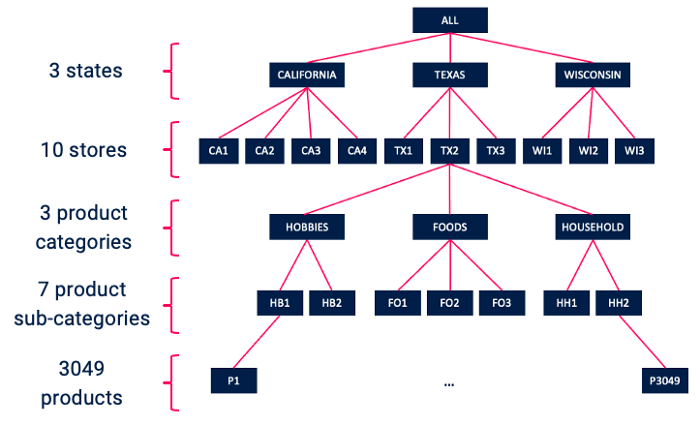

In [24]:
from IPython import display
print('Imagen representativa tomada desde la página de artefact')
display.Image("https://www.artefact.com//wp-content/uploads/2021/03/Image-1-.png")

In [25]:
%config IPCompleter.greedy=True
%matplotlib inline

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import random
import seaborn as sns
import plotly.graph_objects as go

# Importación de datos

## Historico de ventas

In [30]:
print('Cantidades vendidas de los últimos 1941 días')
historico_ventas_df = pd.read_csv("./data/sales_train_evaluation.csv",header=0)
historico_ventas_df

Cantidades vendidas de los últimos 1941 días


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


## Calendario

In [31]:
print('Calendario con múltiple información')
calendar_df = pd.read_csv('./data/calendar.csv',header=0)
calendar_df

Calendario con múltiple información


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0


## Precio promedio

In [89]:
print('Precio de venta por artículo en cada fecha')
precio_promedio_df = pd.read_csv('./data/sell_prices.csv',header=0)
precio_promedio_df

Precio de venta por artículo en cada fecha


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.00
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00


# Revisión de ventas por categoría y departamento

A continuación, obtendremos la lista de estados y categorías únicas en nuestro dataset.

In [8]:
print('States:')
for i in historico_ventas_df['state_id'].unique():
    print(i)
print('\nCategories:')
for i in historico_ventas_df['cat_id'].unique():
    print(i)
print('\nDepartments:')
for i in historico_ventas_df['dept_id'].unique():
    print(i)

States:
CA
TX
WI

Categories:
HOBBIES
HOUSEHOLD
FOODS

Departments:
HOBBIES_1
HOBBIES_2
HOUSEHOLD_1
HOUSEHOLD_2
FOODS_1
FOODS_2
FOODS_3


Según esta lista procederemos a crear 3 graficas por cada categoría de forma aleatoria, para esto se crearon 2 funciones, llamada plotItems que se encarga de graficar nuestros datos y otra llamada plotCategoryBystate que se encarga de extraer la información por categoría para el estado seleccionado

In [36]:
def plotItems(category:str,random_item:int,df):
    
    fig, axs = plt.subplots(figsize=(15, 6), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    #plt.title(category)
    
    plt.plot(list(range(0, 1941)),df.iloc[random_item[0],6:], label=df.iloc[random_item[0],0], alpha=0.4)
    plt.plot(list(range(0, 1941)),df.iloc[random_item[1],6:], label=df.iloc[random_item[1],0], alpha=0.4)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc='upper left')
    plt.title('Categoría: ' + category)
    plt.show()

In [37]:
data_state = historico_ventas_df[historico_ventas_df['state_id']=='CA']
data_ca_cat = data_state[data_state['dept_id']=='HOBBIES_1']

In [38]:
def plotCategoryBystate(state:str,df=None):
    data_state = df[df['state_id']==state]
    list_categories = list(data_state['dept_id'].unique())
    for category in list_categories:
        data_ca_cat = data_state[data_state['dept_id']==category]
        data_ca_cat.reset_index()
        random_items = random.randint(len(data_ca_cat)-1, size=(2))
        plotItems(category,random_items,data_ca_cat)
        
        

## Revisión por estado y departamento de tendencia (aleatorio)

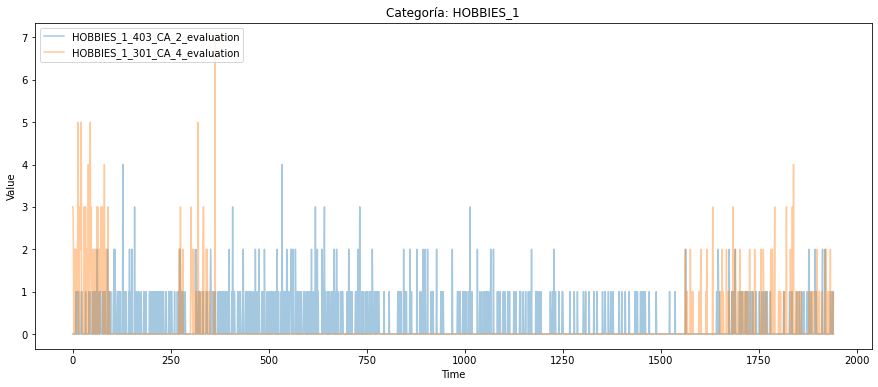

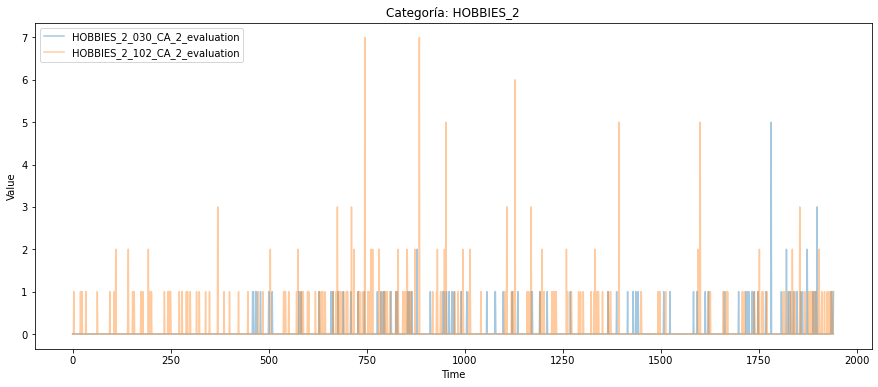

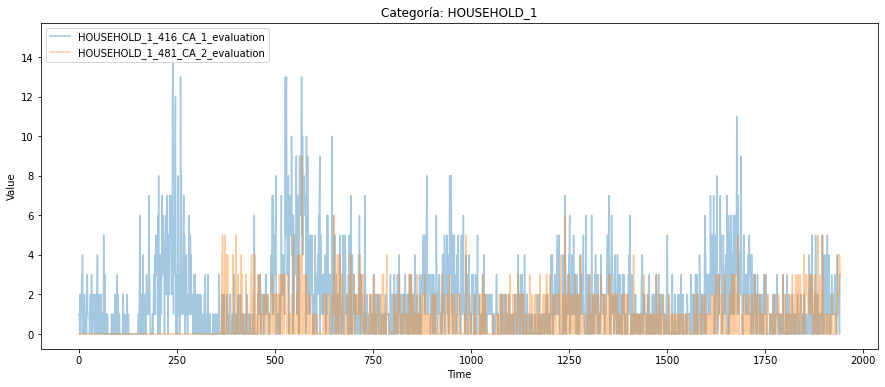

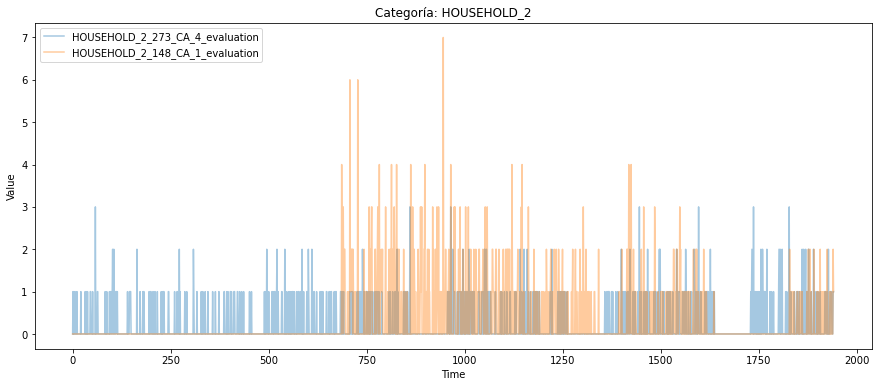

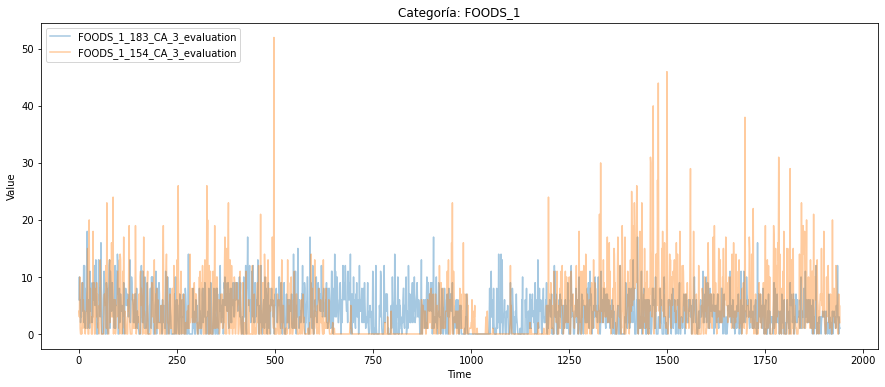

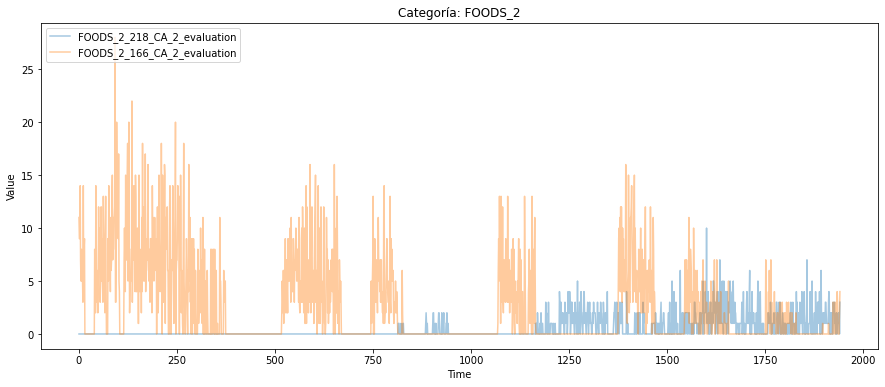

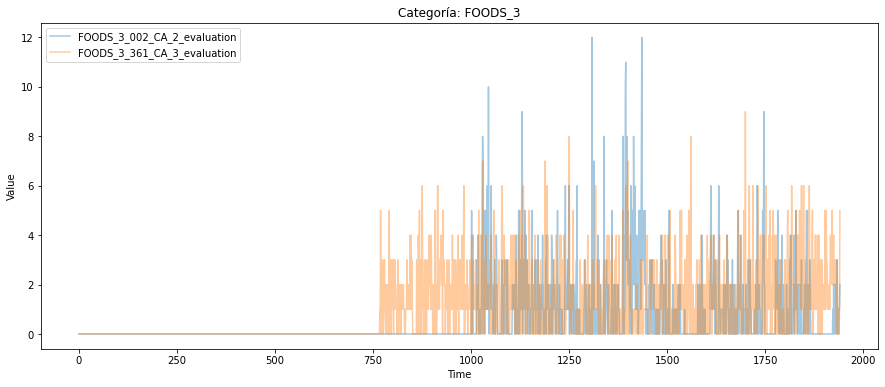

In [39]:
plotCategoryBystate('CA',historico_ventas_df)

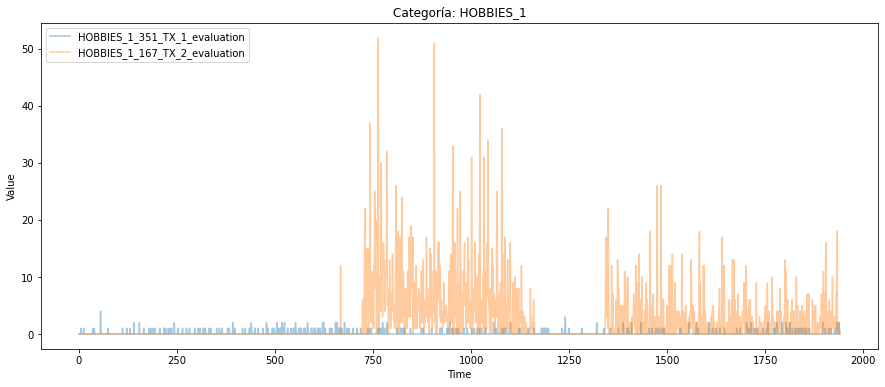

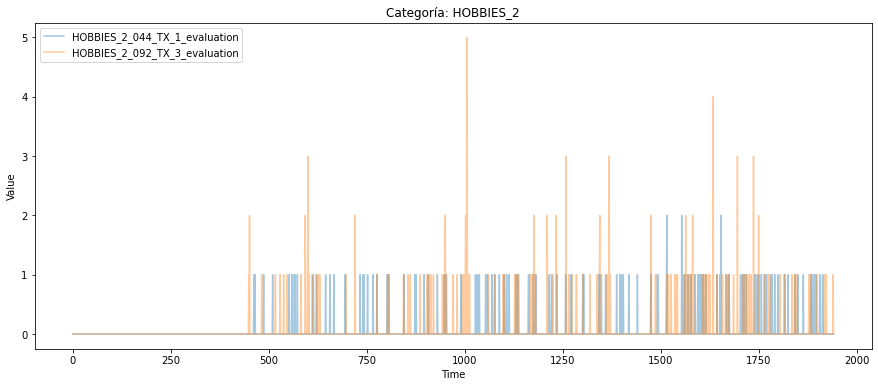

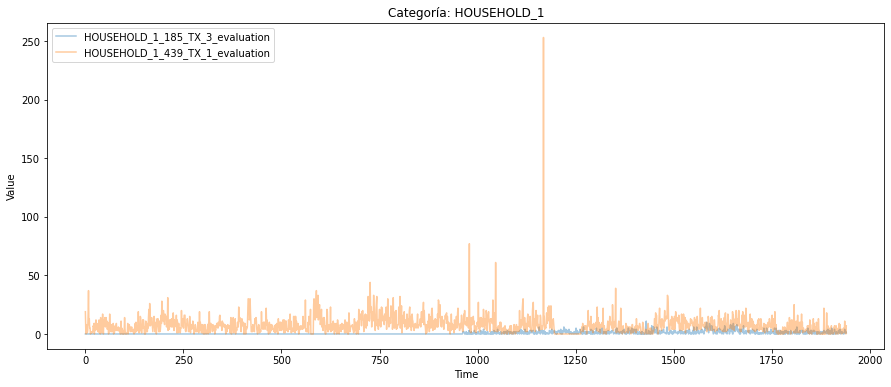

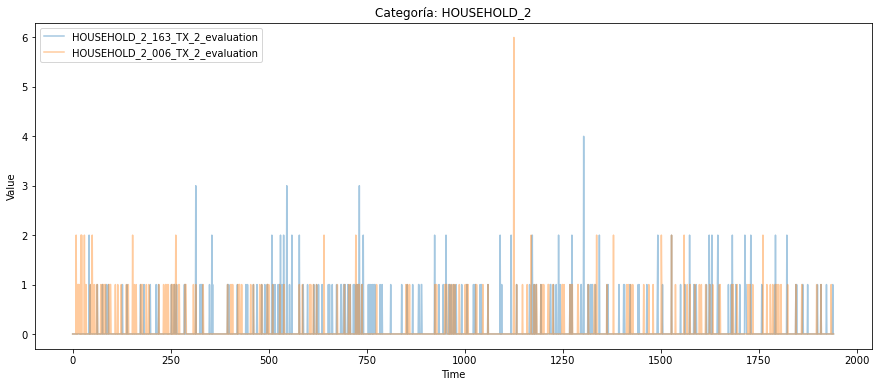

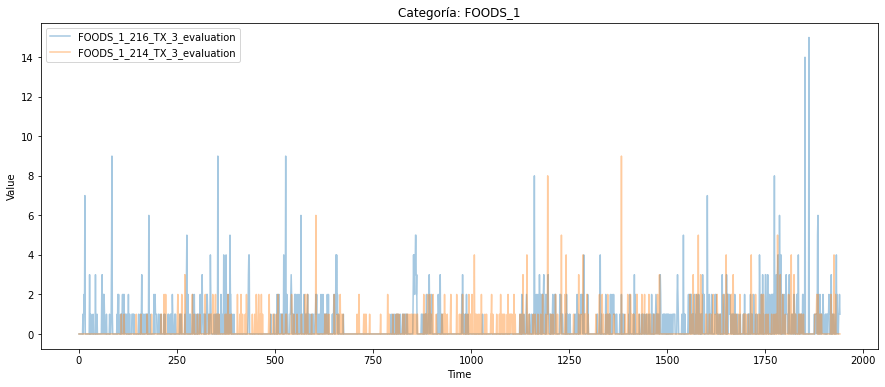

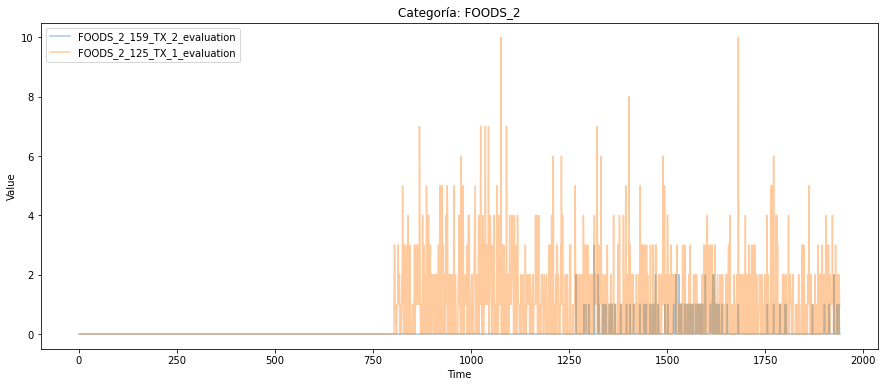

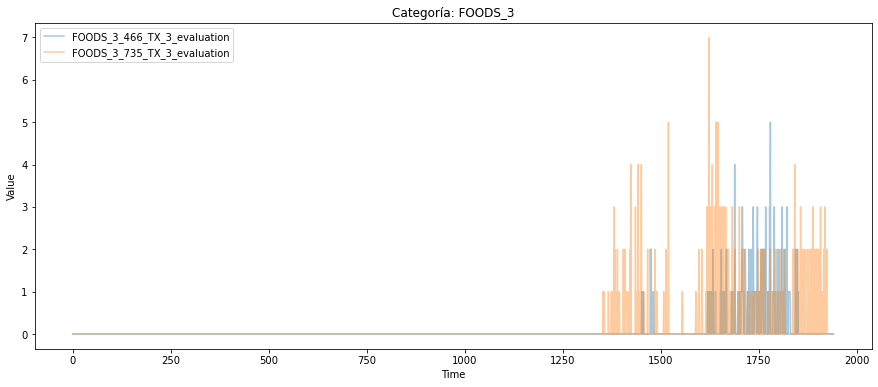

In [40]:
plotCategoryBystate('TX',historico_ventas_df)

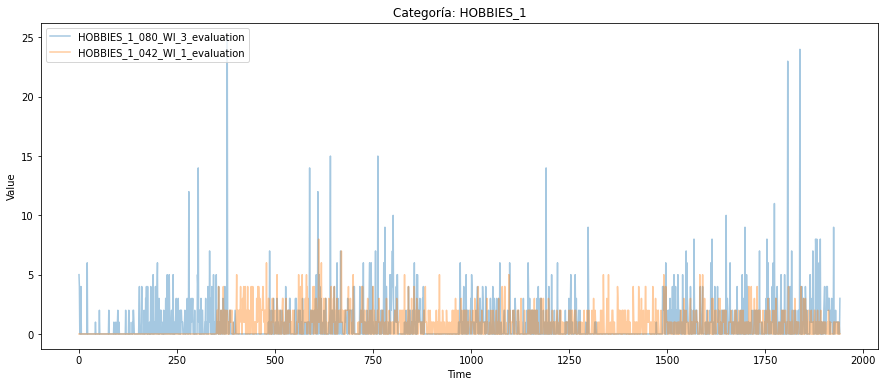

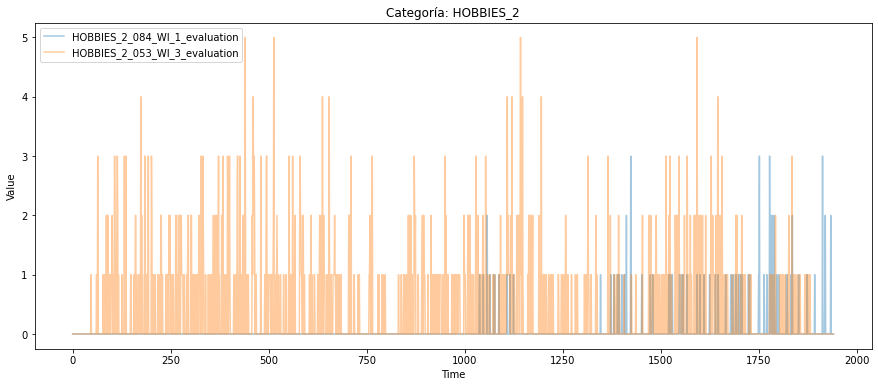

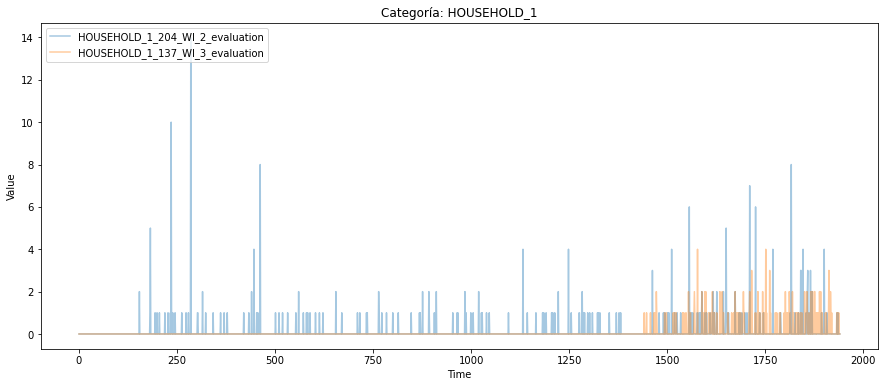

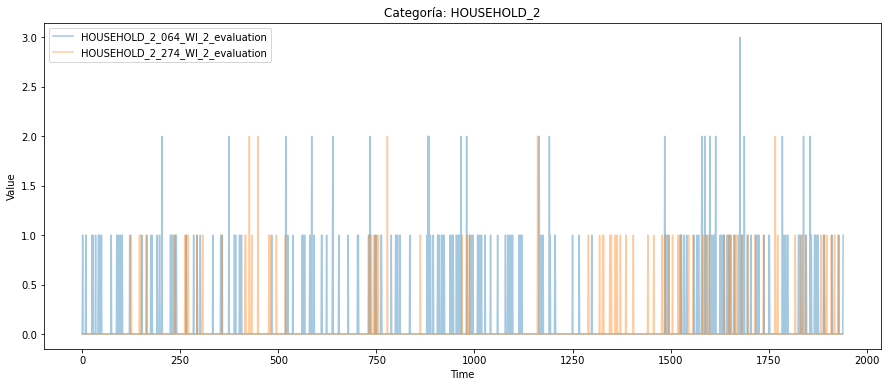

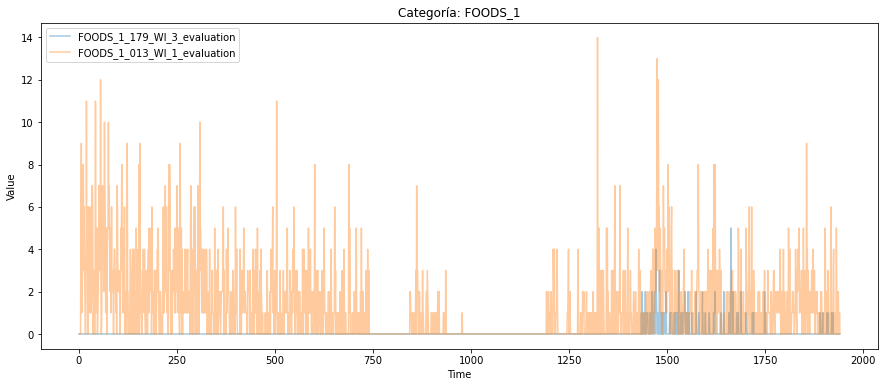

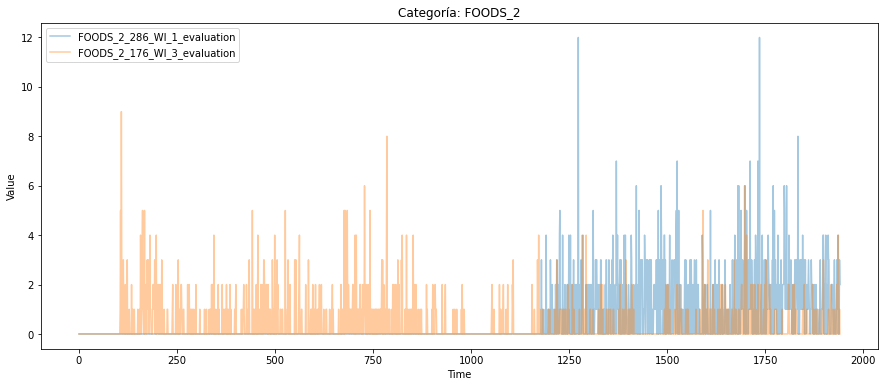

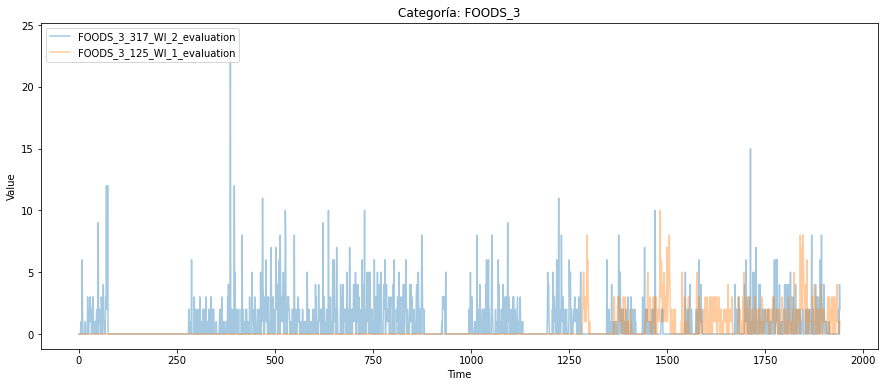

In [41]:
plotCategoryBystate('WI',historico_ventas_df)

No se logra observar ningún comportamiento similar entre las categorías de los productos en cada estado, por lo cual se estima que sus comportamientos internamente no tienen un correlación muy alta entre la mayoría de estos y puede haber otros factores que este afectando las ventas y movimientos.

## Revisión de ventas por categoría

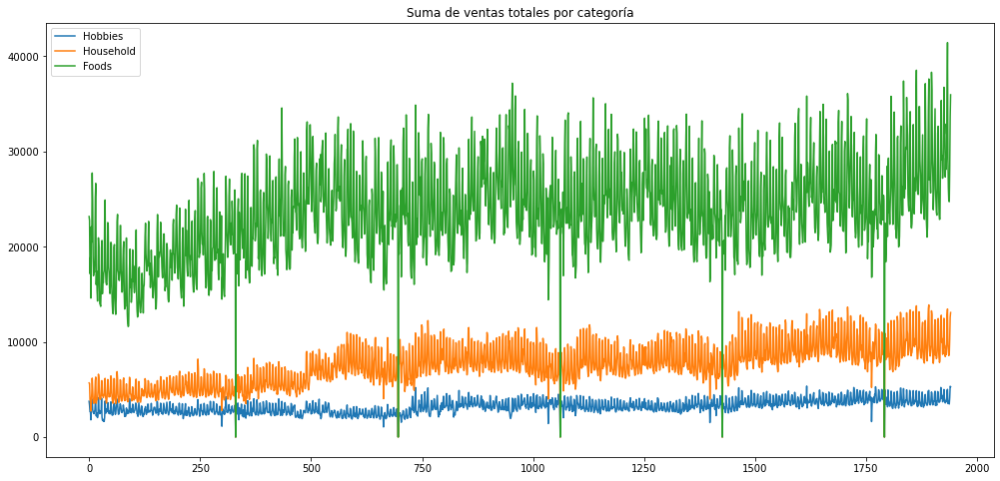

In [42]:
plt.figure(figsize=(17,8))
plt.plot(list(range(0, 1941)),historico_ventas_df[historico_ventas_df['cat_id']=='HOBBIES'].iloc[:,6:].sum(),label='Hobbies')
plt.plot(list(range(0, 1941)),historico_ventas_df[historico_ventas_df['cat_id']=='HOUSEHOLD'].iloc[:,6:].sum(),label='Household')
plt.plot(list(range(0, 1941)),historico_ventas_df[historico_ventas_df['cat_id']=='FOODS'].iloc[:,6:].sum(),label='Foods')
plt.title('Suma de ventas totales por categoría')
plt.legend(loc="upper left")
plt.show()

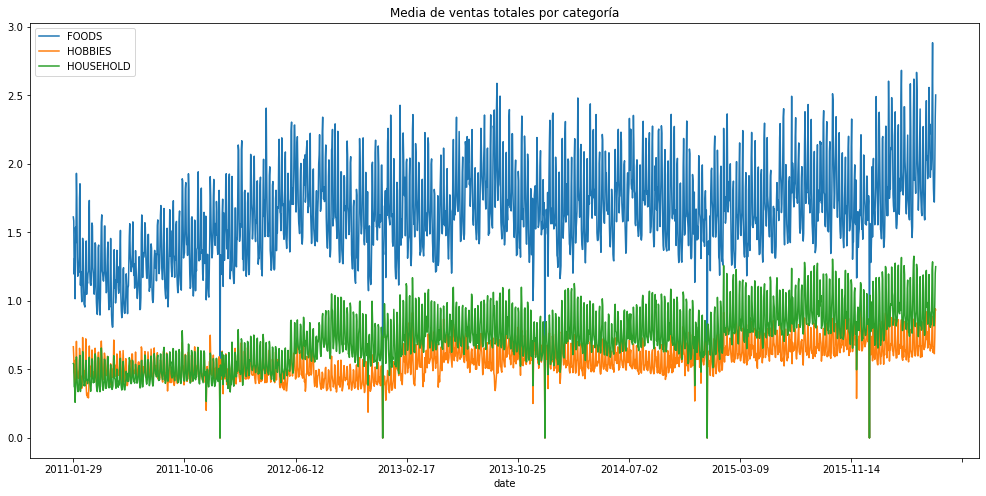

In [43]:
# Code reference: https://github.com/mansi2596/Kaggle-M5-Forecast-Accuracy-Data/blob/master/DemandForecasting_EDA.ipynb
temp=historico_ventas_df.groupby('cat_id').mean().T.reset_index().rename(columns={'index':'d'})\
.merge(calendar_df[['date','d']],how='left',validate='1:1').set_index('date')
temp.plot(figsize=(17,8))
plt.title('Media de ventas totales por categoría')
plt.show()

Cuando graficamos ventas totales a nivel de categoría se observa que hay cierto nivel de estacionariedad, con unas caídas siempre en un rango de tiempo para todos los elementos. Aparte de esto, se observa que la categoría de comida es la prominente a nivel de ventas, esto se observa mejor cuando usamos la suma, donde se denota una mayor diferencia. siguiente a esta los hobbies ocupan el segundo lugar y finalmente la categoría household, este tiene un comportamiento más plano, pero observando la media se puede observar una tendencia creciente para esta.

## Revisión por departamento a nivel macro

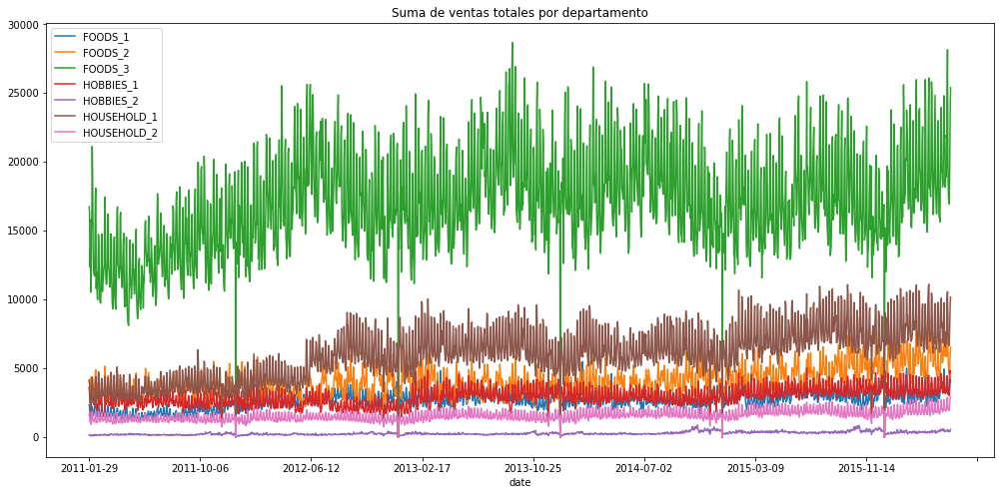

In [44]:
temp=historico_ventas_df.groupby('dept_id').sum().T.reset_index().rename(columns={'index':'d'})\
.merge(calendar_df[['date','d']],how='left',validate='1:1').set_index('date')
temp.plot(figsize=(17,8))
plt.title('Suma de ventas totales por departamento')
plt.show()

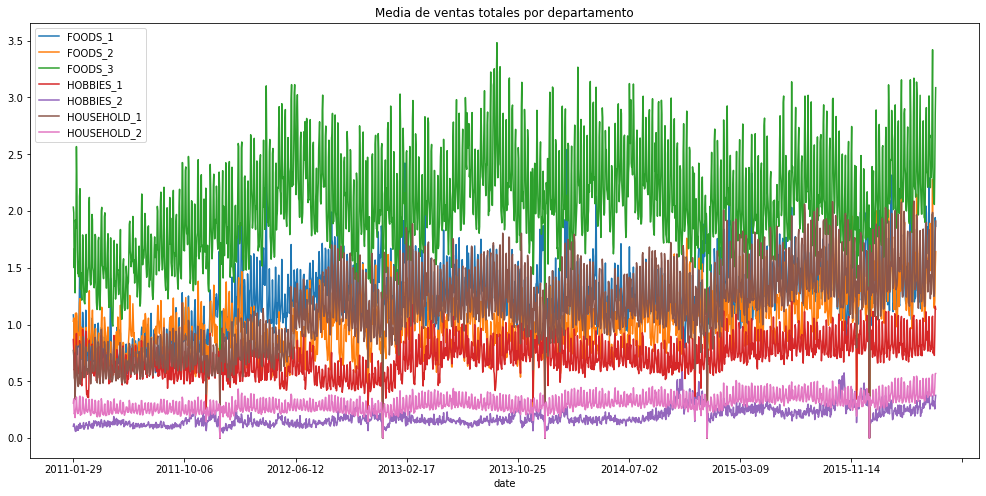

In [45]:
temp=historico_ventas_df.groupby('dept_id').mean().T.reset_index().rename(columns={'index':'d'})\
.merge(calendar_df[['date','d']],how='left',validate='1:1').set_index('date')
temp.plot(figsize=(17,8))
plt.title('Media de ventas totales por departamento')
plt.show()

lendo un poco mas a fondo se nota que incluseo dentro de las categorias a un nivel mas profundo, una de las categorias de comida (FOODS_3) tiene venta mucho mayores al resto de items ofrecidos por Walmart. A su vez, ser observa una categoria extremadamente plana y con un muy bajo volumen de ventas (HOUSEHOLD_1)

## Revisión por estado total de ventas

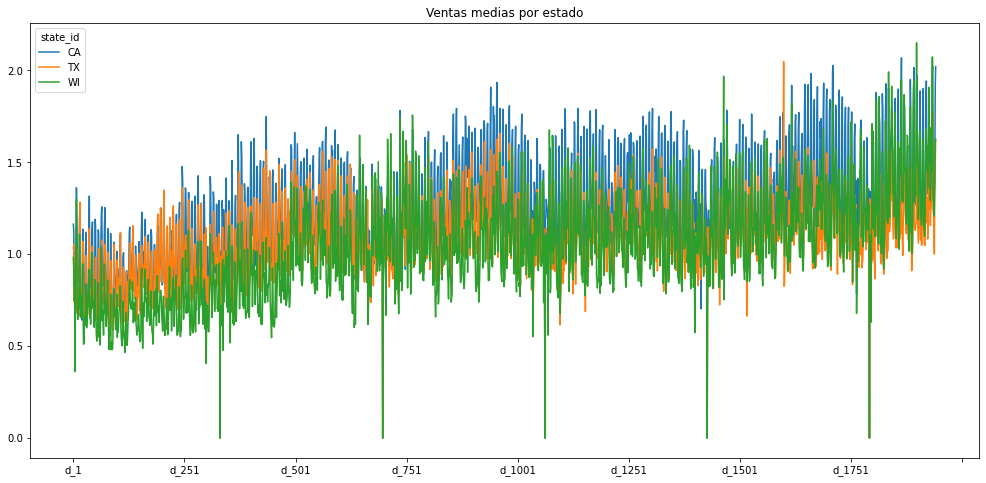

In [46]:
historico_ventas_df.groupby('state_id').mean().T.plot(figsize=(17,8))
plt.title('Ventas medias por estado')
plt.show()

Las ventas totales entre los 3 estados han sido parejas a lo largo del tiempo con una tendencia de crecimiento en ventas continua. Por lo cual se asume una mayor regularidad de ventas a medida que se hace una visión más global de los históricos obtenidos.

# Venta por tienda por cada estado

Se verificará si hay distinciones claras entre las ventas que tiene cada tienda en cada estado, con esto podremos conocer si hay algún patrón entre ellas o si hay algunas que vendan mas que otras.

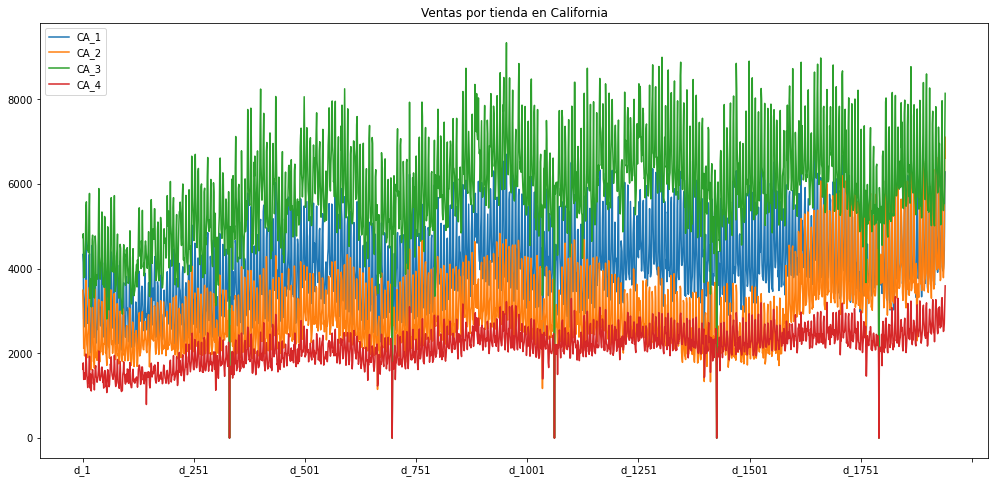

In [53]:
by_store = historico_ventas_df[historico_ventas_df['state_id']=='CA'].groupby('store_id').sum().T.plot(figsize=(17,8))
plt.title('Ventas por tienda en California')
plt.legend(loc='upper left')
plt.show()

Se observa que para el estado de California la tienda numero 3 tiende a tener mas ventas que el resto. A su vez, desde hace poco tiempo se logro igualar las ventas de las tiendas 2 y 1. Mientras que la tienda número 4 sigue teniendo bajas ventas a comparación del resto.

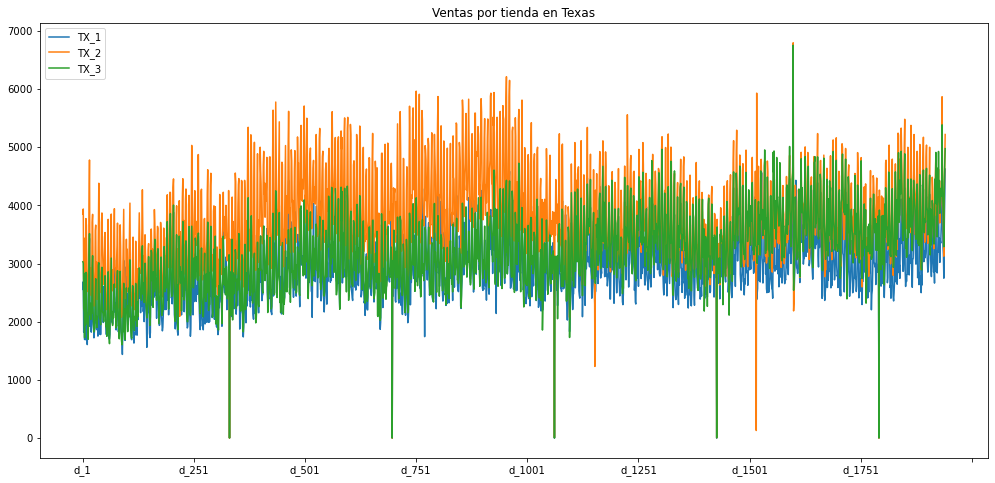

In [52]:
by_store = historico_ventas_df[historico_ventas_df['state_id']=='TX'].groupby('store_id').sum().T.plot(figsize=(17,8))
plt.title('Ventas por tienda en Texas')
plt.legend(loc='upper left')
plt.show()

En el estado de texas ya se logro una mayor uniformidad de las ventas entre todas las tiendas desde hace mas de 1 año, esto podría generar que se tengan sistemas y cantidades de abastecimiento mas similares entre las 3 tiendas.

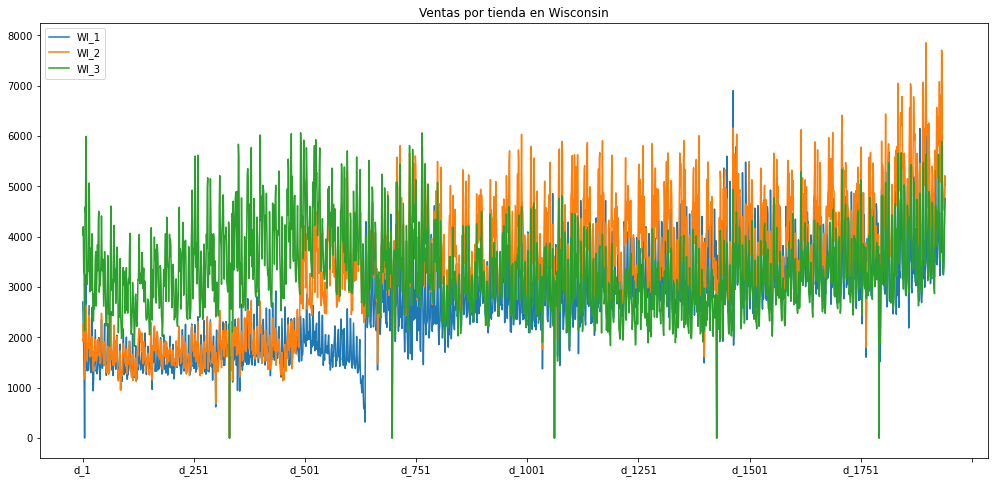

In [77]:
by_store = historico_ventas_df[historico_ventas_df['state_id']=='WI'].groupby('store_id').sum().T.plot(figsize=(17,8))
plt.title('Ventas por tienda en Wisconsin')
plt.legend(loc='upper left')
plt.show()

Para el caso de Wisconsin se logra apreciar un cambio brusco casi al inicio de la serie para las tiendas 1 y 2 que logran igualar las ventas de la tienda 3 que hasta ese punto había sido muy superiores. Sin embargo, se puede decir que hay una tendencia actual a que la tienda número 2 tenga más ventas.

Este cambio mencionado puede deberse a múltiples factores, una posible teoría es que se imitaron las estrategias de a tienda 3 para las otras, logrando así mejorar los resultados de venta.

# Suavizando la serie

### Comportamiento a nivel de estado

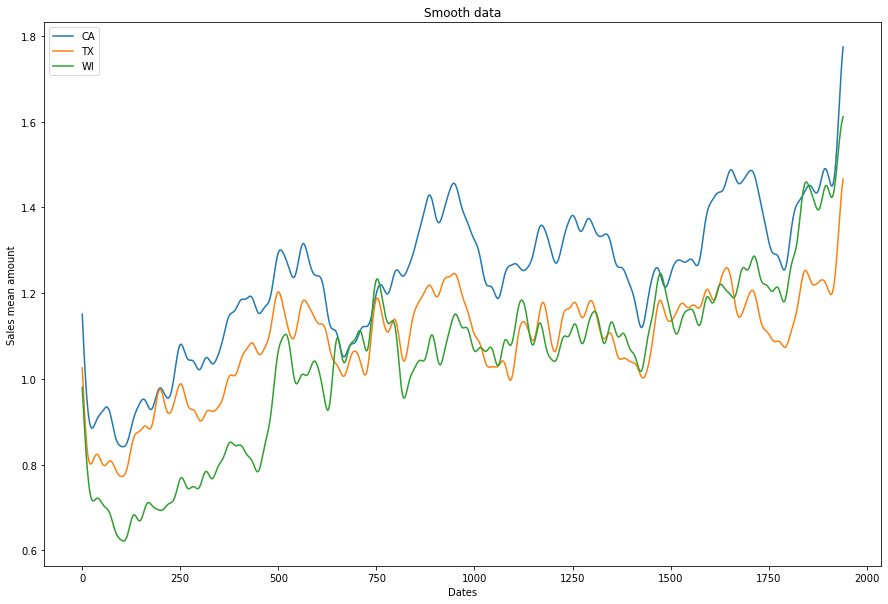

In [55]:
import scipy.signal as signal

# First, design the Buterworth filter
N  = 5    # Filter order
Wn = 0.05 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
plt.figure(figsize=(15,10))
states = historico_ventas_df['state_id'].unique()
state_historic_data = plt.plot(signal.filtfilt(B,A,historico_ventas_df.groupby('state_id').mean().T['CA']),label='CA')
state_historic_data = plt.plot(signal.filtfilt(B,A,historico_ventas_df.groupby('state_id').mean().T['TX']),label='TX')
state_historic_data = plt.plot(signal.filtfilt(B,A,historico_ventas_df.groupby('state_id').mean().T['WI']),label='WI')
plt.xlabel('Dates')
plt.ylabel('Sales mean amount')
plt.legend(loc='best')
plt.title('Smooth data')
plt.show()

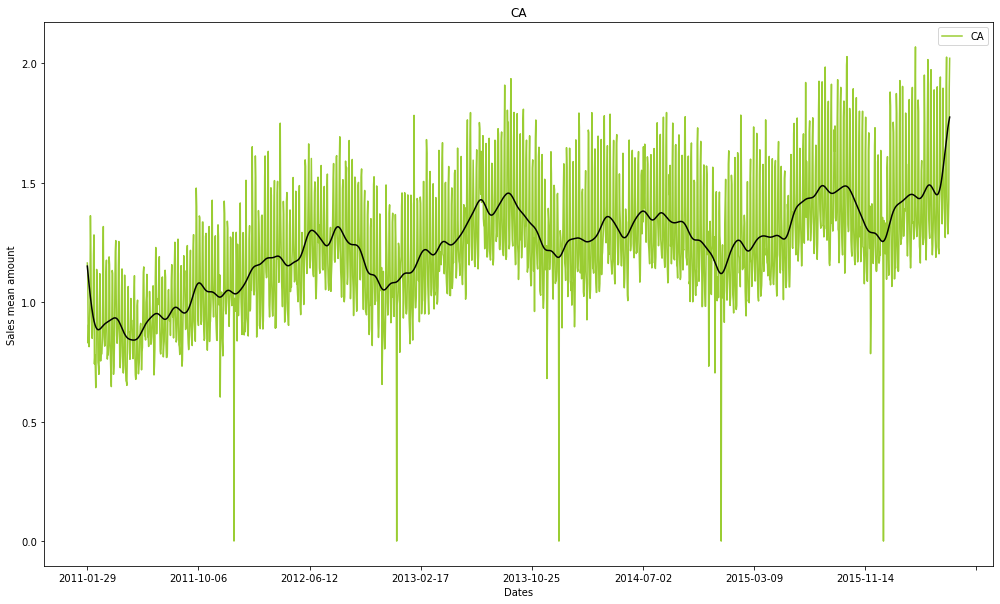

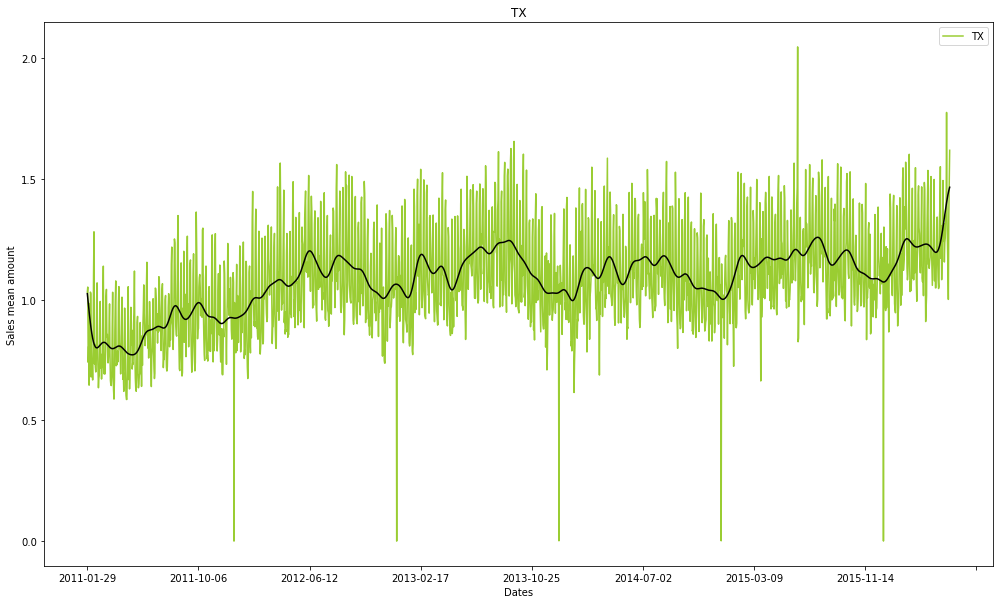

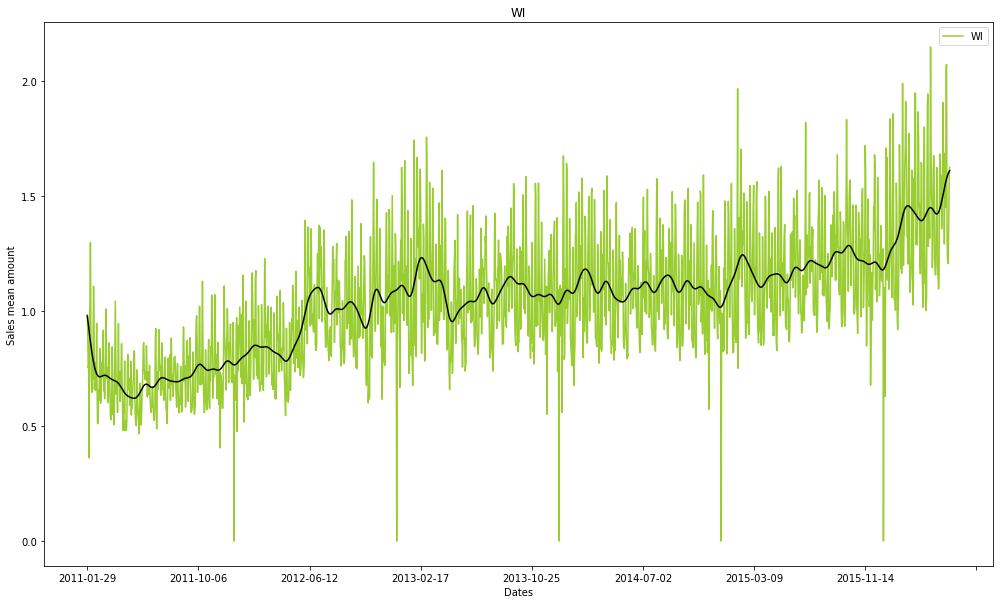

In [56]:
import scipy.signal as signal

# First, design the Buterworth filter
N  = 5    # Filter order
Wn = 0.05 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
for state in historico_ventas_df['state_id'].unique():
    state_historic_data = historico_ventas_df.groupby('state_id')\
                          .mean().T[state].reset_index().rename(columns={'index':'d'})\
                          .merge(calendar_df[['date','d']],how='left',validate='1:1').set_index('date')
    state_historic_data.plot(figsize=(17,10),color='yellowgreen')
    state_historic_data = historico_ventas_df.groupby('state_id').mean().T[state]
    smooth_data = signal.filtfilt(B,A, state_historic_data)
    plt.plot(smooth_data,'k-')
    plt.title(state)
    plt.xlabel('Dates')
    plt.ylabel('Sales mean amount')
    plt.show()

En los datos observamos que los estados de California y Wisconsin tienen una tendencia creciente en sus ventas, mientras Texas esta más estable. A su vez a nivel macro de estado California y Texas cuentan con comportamiento más regular, Wisconsin apenas se está empezando a regularizar en su movimiento.

### Comportamiento por tienda en California

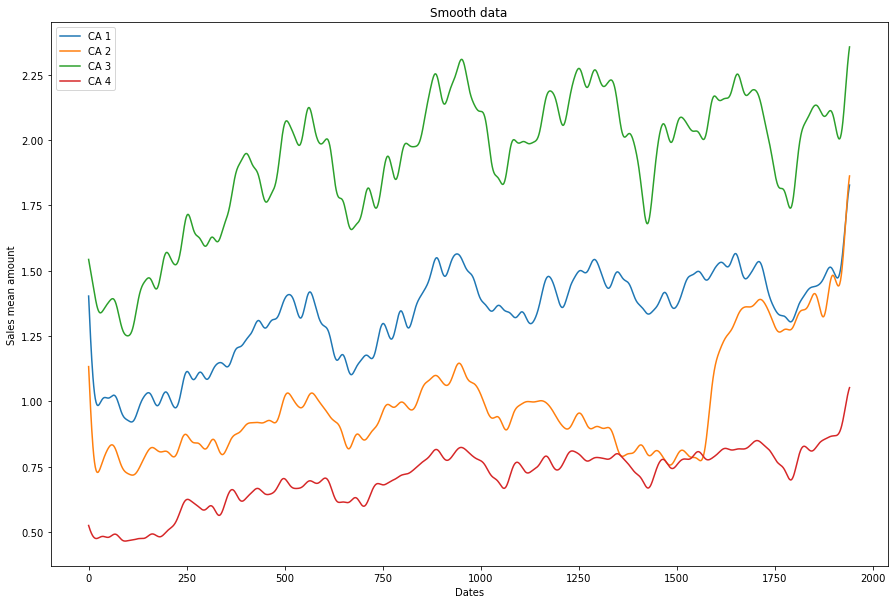

In [58]:
import scipy.signal as signal

# First, design the Buterworth filter
N  = 5    # Filter order
Wn = 0.05 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
plt.figure(figsize=(15,10))
states = historico_ventas_df['state_id'].unique()
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='CA'].\
                                   groupby('store_id').mean().T['CA_1']),label='CA 1')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='CA'].\
                                   groupby('store_id').mean().T['CA_2']),label='CA 2')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='CA'].\
                                   groupby('store_id').mean().T['CA_3']),label='CA 3')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='CA'].\
                                   groupby('store_id').mean().T['CA_4']),label='CA 4')
plt.xlabel('Dates')
plt.ylabel('Sales mean amount')
plt.legend(loc='best')
plt.title('Smooth data')
plt.show()

In [67]:
def plot_denoise_series(state:str, state_name:str):
    import scipy.signal as signal
    
    
    stores_state = historico_ventas_df[historico_ventas_df['state_id']==state]['store_id'].unique()
    # First, design the Buterworth filter
    N  = 5    # Filter order
    Wn = 0.05 # Cutoff frequency
    B, A = signal.butter(N, Wn, output='ba')
    for stores in stores_state:
        state_historic_data = historico_ventas_df[historico_ventas_df['state_id']==state].groupby('store_id')\
                              .mean().T[stores].reset_index().rename(columns={'index':'d'})\
                              .merge(calendar_df[['date','d']],how='left',validate='1:1').set_index('date')
        state_historic_data.plot(figsize=(17,10),color='yellowgreen')
        state_historic_data = historico_ventas_df[historico_ventas_df['state_id']==state].groupby('store_id')\
                              .mean().T[stores]
        smooth_data = signal.filtfilt(B,A, state_historic_data)
        plt.plot(smooth_data,'k-')
        plt.title(state_name + ' tienda: ' + stores)
        plt.xlabel('Dates')
        plt.ylabel('Sales mean amount')
        plt.show()

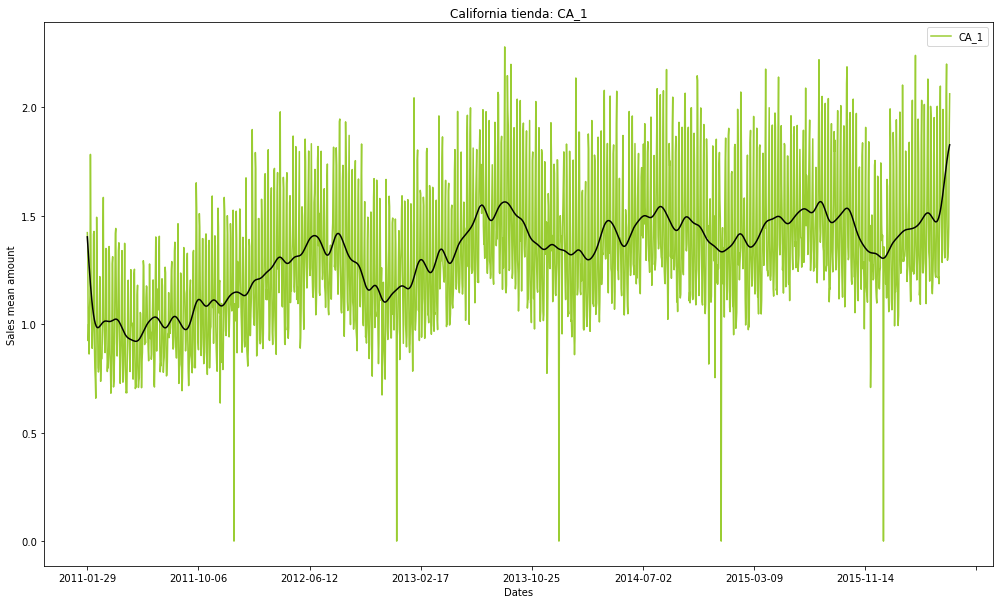

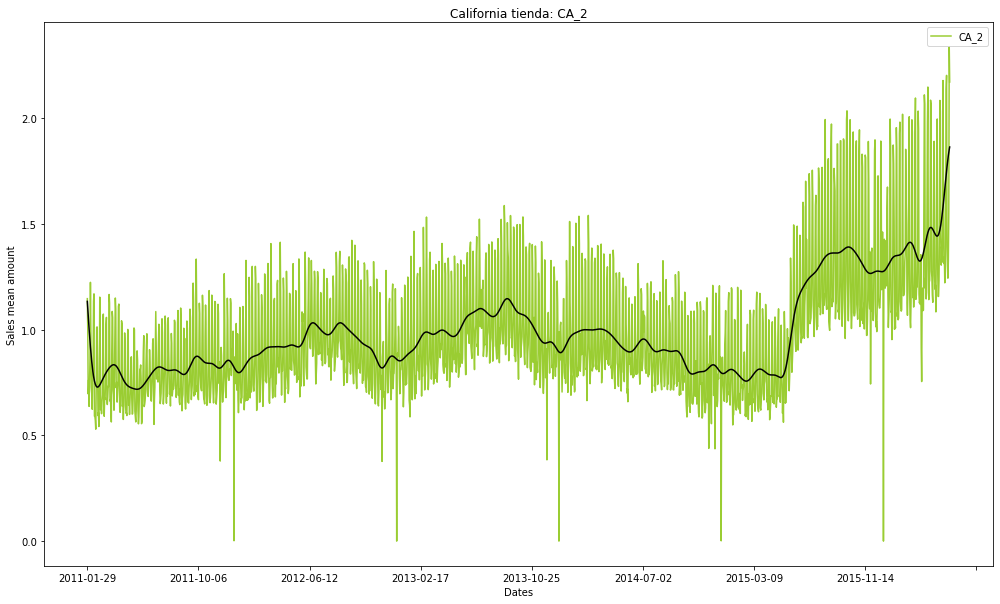

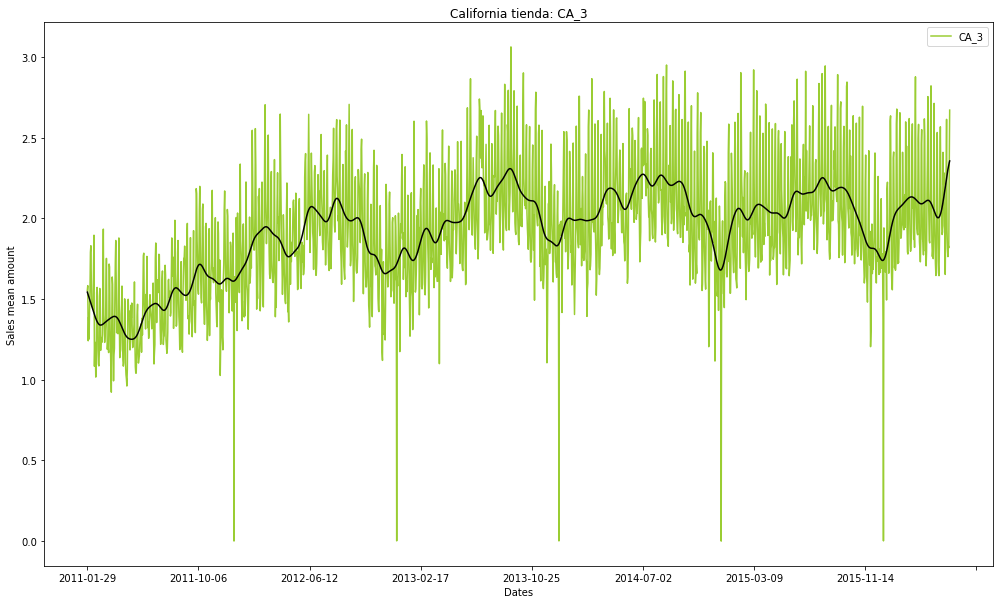

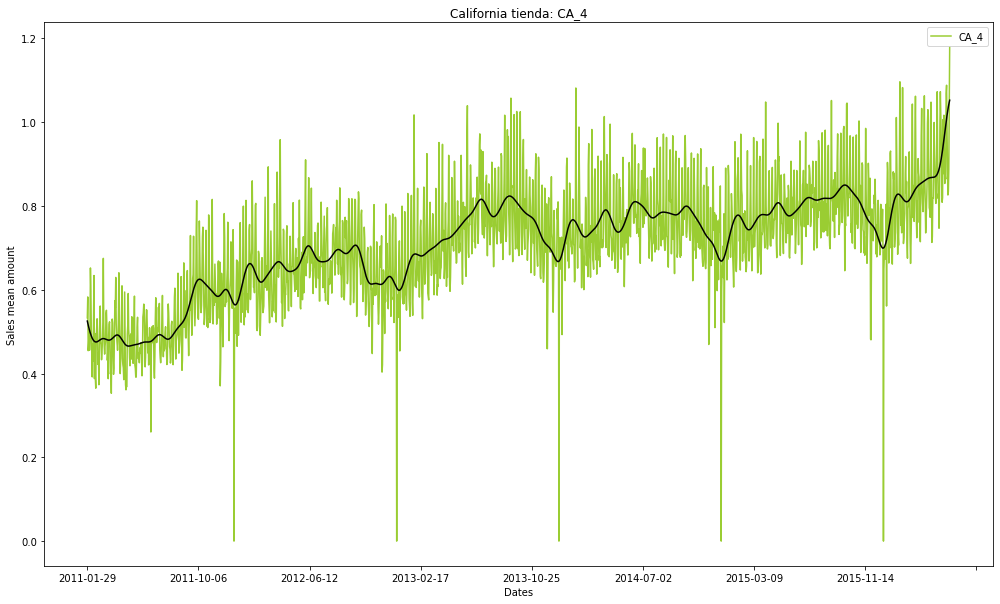

In [69]:
plot_denoise_series('CA','California')

Para california observamos un evento particular que no se notó anteriormente, hay un crecimiento acelerado en un periodo menor a los 6 meses para la tienda número 2. Para este estado seguimos observando una tendencia creciente en las ventas, pero a diferencia del anterior, se nota un comportamiento estacionario en los datos, con pitos regulares cada cierto tiempo y caídas similares.

### Comportamiento por tienda en Texas

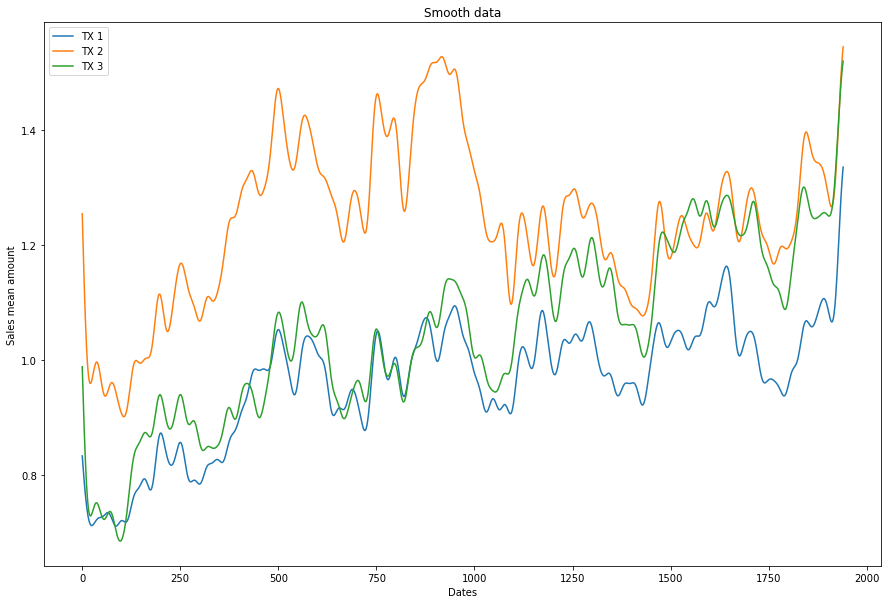

In [70]:
import scipy.signal as signal

# First, design the Buterworth filter
N  = 5    # Filter order
Wn = 0.05 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
plt.figure(figsize=(15,10))
states = historico_ventas_df['state_id'].unique()
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='TX'].\
                                   groupby('store_id').mean().T['TX_1']),label='TX 1')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='TX'].\
                                   groupby('store_id').mean().T['TX_2']),label='TX 2')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='TX'].\
                                   groupby('store_id').mean().T['TX_3']),label='TX 3')
plt.xlabel('Dates')
plt.ylabel('Sales mean amount')
plt.legend(loc='best')
plt.title('Smooth data')
plt.show()

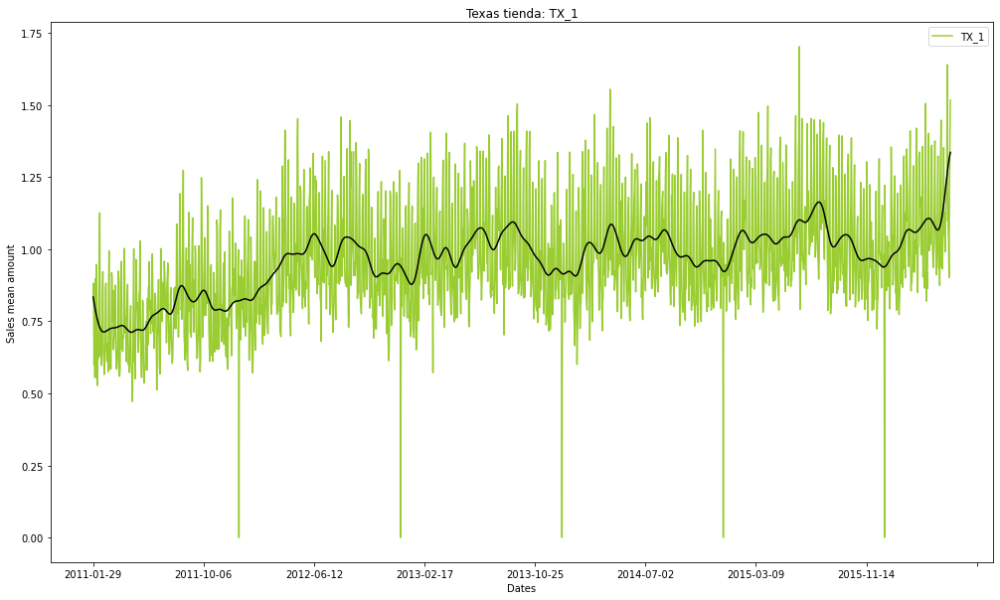

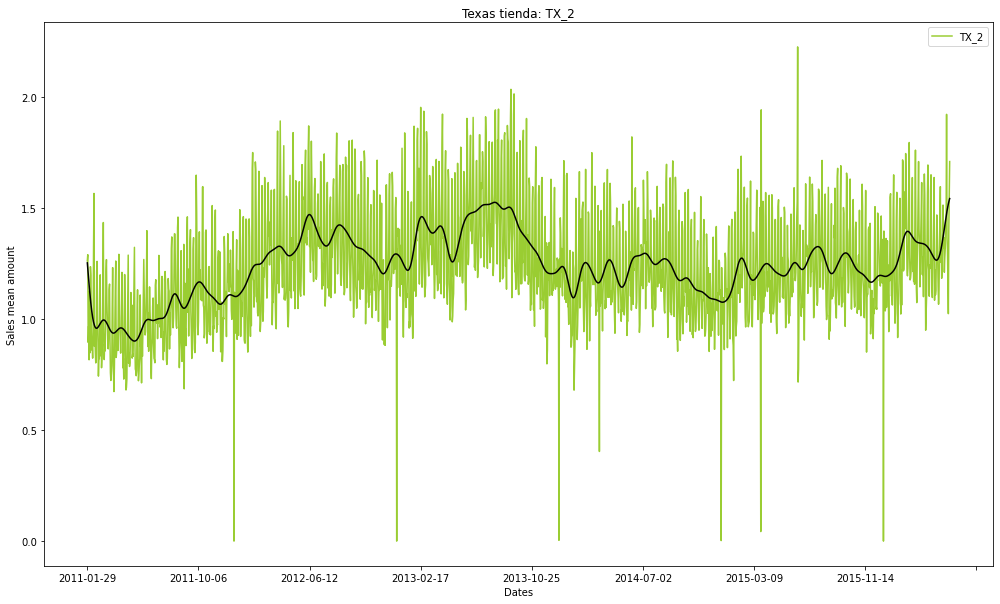

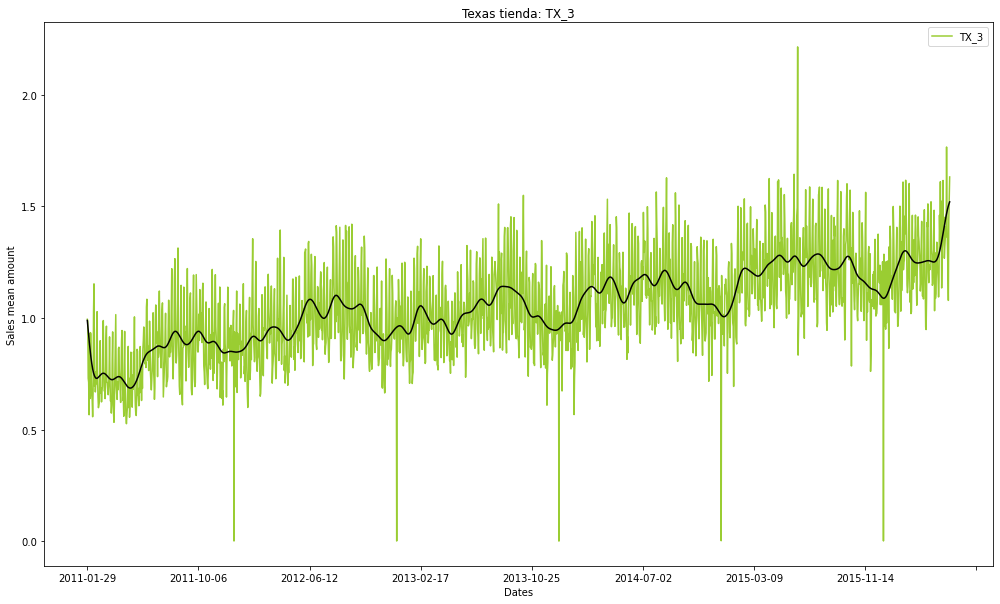

In [71]:
plot_denoise_series('TX','Texas')

En el caso de Texas, solo una de las tiendas muestra un comportamiento un poco más claro creciente (la tienda 3). Se observa que esta más estable en sus ventas y cuenta con picos regulares, aunque no tengo como california, este estado no parece estar creciendo en ventas y parece se ha estabilizado en su comportamiento.

### Comportamiento por tienda en Wisconsin

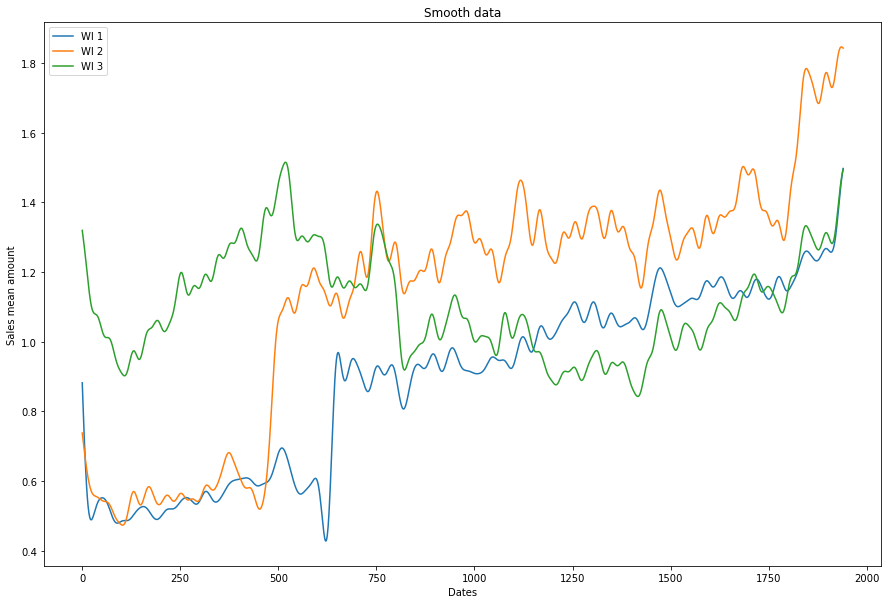

In [72]:
import scipy.signal as signal

# First, design the Buterworth filter
N  = 5    # Filter order
Wn = 0.05 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
plt.figure(figsize=(15,10))
states = historico_ventas_df['state_id'].unique()
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='WI'].\
                                   groupby('store_id').mean().T['WI_1']),label='WI 1')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='WI'].\
                                   groupby('store_id').mean().T['WI_2']),label='WI 2')
plt.plot(signal.filtfilt(B,A,historico_ventas_df[historico_ventas_df['state_id']=='WI'].\
                                   groupby('store_id').mean().T['WI_3']),label='WI 3')
plt.xlabel('Dates')
plt.ylabel('Sales mean amount')
plt.legend(loc='best')
plt.title('Smooth data')
plt.show()

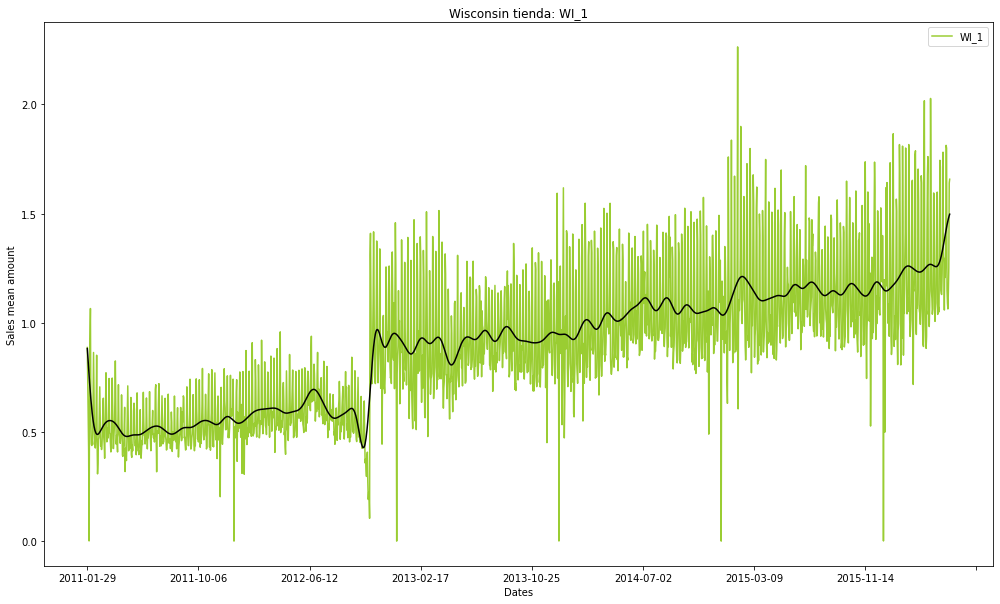

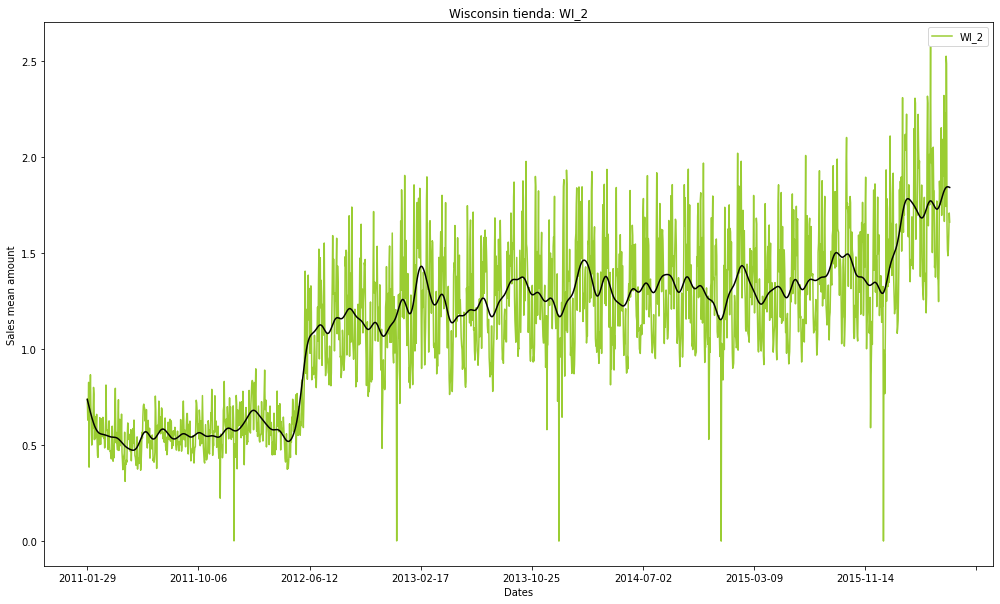

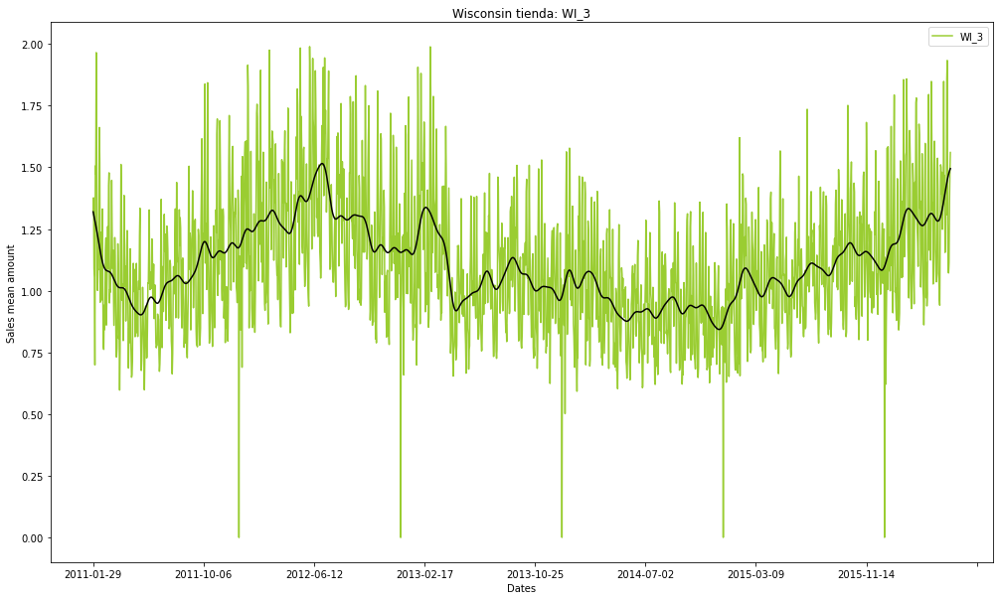

In [76]:
plot_denoise_series('WI','Wisconsin')

Las primeras dos tiendas se observa una caída en ventas antes de empezar un ascenso. ambas se dieron en tiempos similares como se observó anteriormente, la data con menos ruido permite ver con mayor claridad este fenómeno.

A su vez, se nota que hay una mayor estabilidad en la tienda número 1 en sus tendencias de venta. La tienda número 2 normalmente tiene caídas más abruptas a comparación de la 1 antes de un crecimiento, mientras la tienda número 3 que se veía fuerte inicialmente apenas se está recuperando de una baja en ventas que suro más de 2 años.

Al momento actual, las 3 tiendas presentan una tendencia creciente.

Se puede decir que los comportamientos globales de los estados si se observan en cada tienda dentro de los mismos con muy pequeñas diferencias, por lo cual se asume que tenemos una serie con algo de estacionalidad sin ser este muy elevado y cada vez se orienta más a una serie estacionaria.


Se puede decir que los comportamientos globales de los estados si se observan en cada tienda dentro de los mismos con muy pequeñas diferencias, por lo cual se asume que tenemos una serie con algo de seasonality sin ser este muy elevado y cada vez se orienta mas a una serie estacionaria.

In [74]:
#code referece: https://www.kaggle.com/tarunpaparaju/m5-competition-eda-models
d_cols = [c for c in historico_ventas_df.columns if 'd_' in c]
past_sales = historico_ventas_df.set_index('id')[d_cols] \
    .T \
    .merge(calendar_df.set_index('d')['date'],
           left_index=True,
           right_index=True,
            validate='1:1') \
    .set_index('date')

store_list = precio_promedio_df['store_id'].unique()
means = []
fig = go.Figure()
for s in store_list:
    store_items = [c for c in past_sales.columns if s in c]
    data = past_sales[store_items].sum(axis=1).rolling(90).mean()
    means.append(np.mean(past_sales[store_items].sum(axis=1)))
    fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (per store)")

Se observa un tipo de comportamiento cíclico en la mayoría de nuestros datos. algunos como CA_3 y CA_1 se logra observar más claramente un comportamiento estable. A su vez, podemos decir que todos están en una tendencia creciente, algunos con unas curvas de crecimiento más planas que otros.

En algunas tiendas hay saltos abruptos como se observó anteriormente, validando esta información.

# Box plot

In [75]:
#code referece: https://www.kaggle.com/tarunpaparaju/m5-competition-eda-models
fig = go.Figure()

for i, s in enumerate(store_list):
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name ")

En este grafico podemos observar que las tiendas de Texas tienden a tener un menor nivel de variación en sus ventas y se concentran en los rango de 2800 a 4000 unidades mayormente. En otro caso las diferencias en Wisconsin, aunque son mayores siguen estando algo cercanas las de la tienda 2 y 3, la tienda número uno parece apenas estar recuperándose de la caída vista en numerales anteriores. En el caso de California, este tiene una gran variación entre sus tiendas y tiene ventas que van desde un promedio de 2000 unidades hasta unas 6500 aproximadamente, muestran un comportamiento más diferencial entre ellas.

Finalmente se destaca una gran variabilidad de ventas en WI_2, que tienen la aspersión más grande entre todas las observadas.

# Análisis del calendario

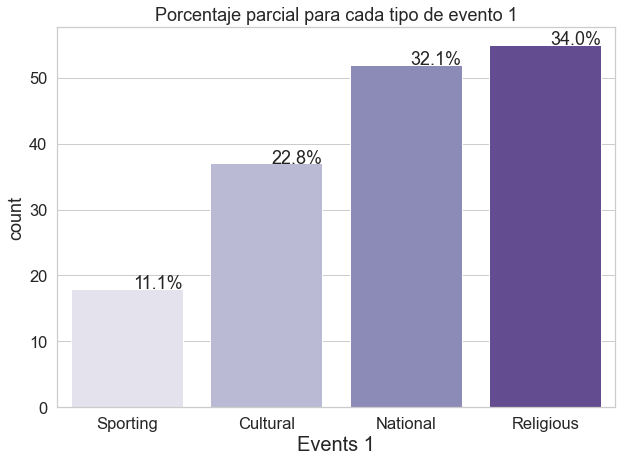

In [79]:
plt.figure(figsize=(10,7))
sns.set(font_scale=1.5) 
sns.set_style(style="whitegrid")
total = float(len(calendar_df['event_type_1'].dropna()))
ax = sns.countplot(data = calendar_df, x = 'event_type_1',palette='Purples')
plt.xlabel('Events 1',fontsize=20)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.title('Porcentaje parcial para cada tipo de evento 1')
plt.show()

Los eventos nacionales y religiosos ocupan más del 60% del total de eventos que se realizan. Estos pueden que influencien el tipo de compras realizadas durante los diferentes periodos del año.

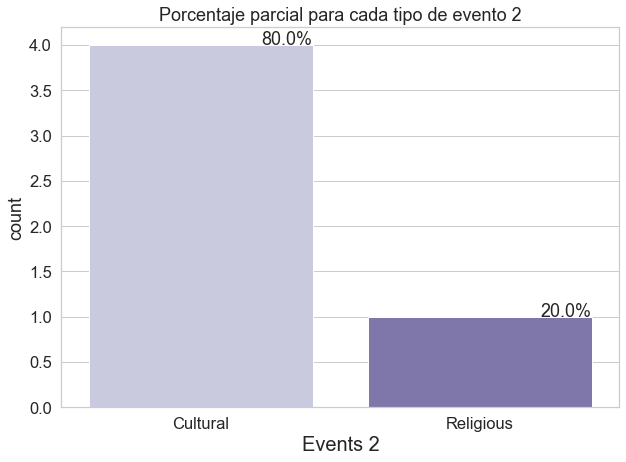

In [80]:
plt.figure(figsize=(10,7))
sns.set(font_scale=1.5) 
sns.set_style(style="whitegrid")
total = float(len(calendar_df['event_type_2'].dropna()))
ax = sns.countplot(data = calendar_df, x = 'event_type_2',palette='Purples')
plt.xlabel('Events 2',fontsize=20)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.title('Porcentaje parcial para cada tipo de evento 2')
plt.show()

Cuando hay un segundo evento en el mismo día estos son solo religiosos o cultures. Con esto se termina de confirmar que los eventos religiosos son los más predominantes. Y aunque estos siguen la gran mayoría de eventos sean culturales, así lo sumáramos con nuestra grafica anterior seguirá siendo el tercer tipo de evento en cantidades.

Por lo cual podemos definir que gran mayoría de eventos se celebran solo 1 por día y estos son nuestra principal fuente de información por si está afectando las ventas.

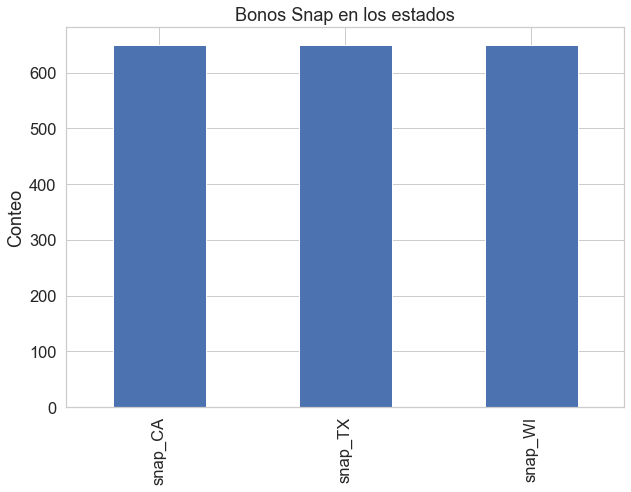

In [81]:
calendar_df.iloc[:,-3:].sum().plot(kind="bar",figsize=(10,7))
plt.title('Bonos Snap en los estados')
plt.ylabel('Conteo')
plt.show()

Los bonos datos por el gobierno son aceptados por todos los estados en la misma cantidad, por ende, este factor no es de mayor intereses. En caso de requerirse mayor precisión se podría incluir debido a que no necesariamente son recibidos los mismos días.

# Selección aleatoria de ventas de producto tipo 'Hobbies' a nivel semanal, mensual y anual

In [83]:
#code referece: https://github.com/mansi2596/Kaggle-M5-Forecast-Accuracy-Data/blob/master/DemandForecasting_EDA.ipynb
hobbies_df=historico_ventas_df[historico_ventas_df['cat_id']=='HOBBIES'][['id']+ d_cols].set_index('id').T
hobbies_df=hobbies_df.reset_index().rename(columns={'index':'d'})
hobbies_df=pd.merge(hobbies_df,calendar_df,how='left',left_on='d',right_on='d').set_index('date')

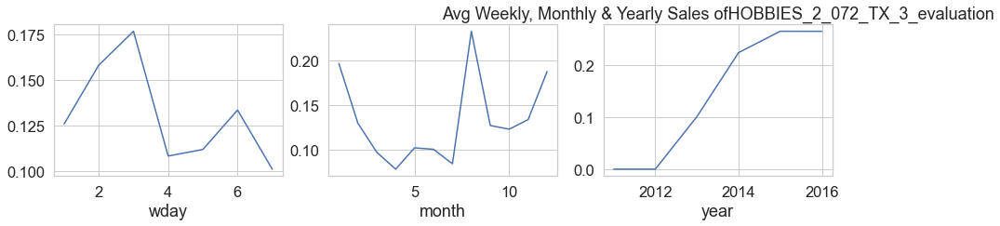

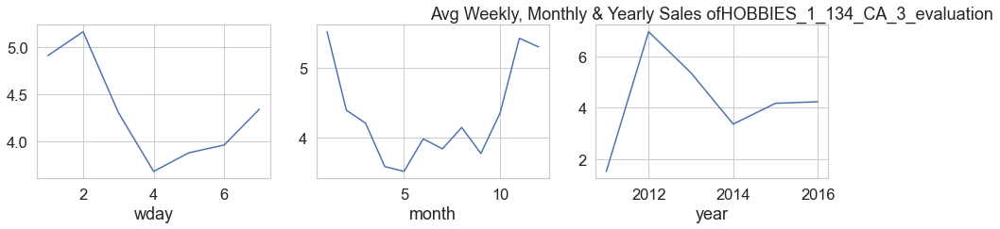

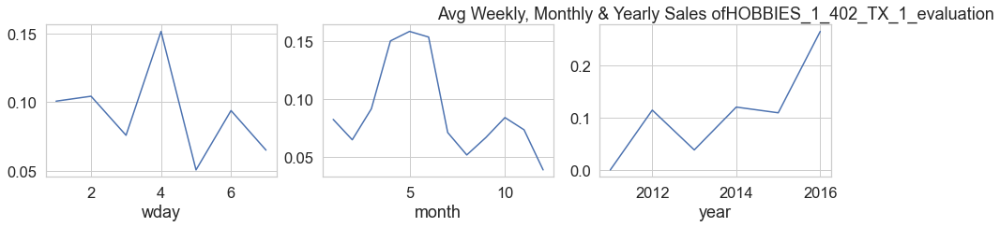

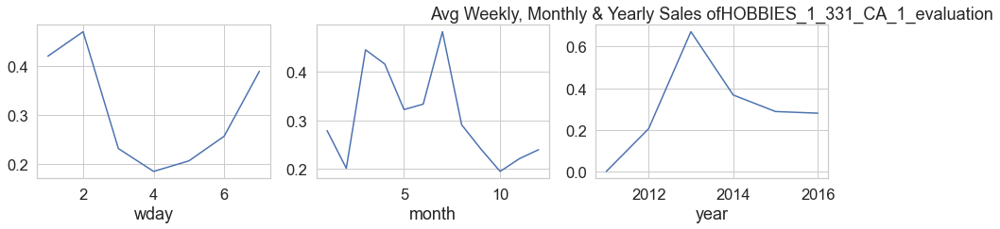

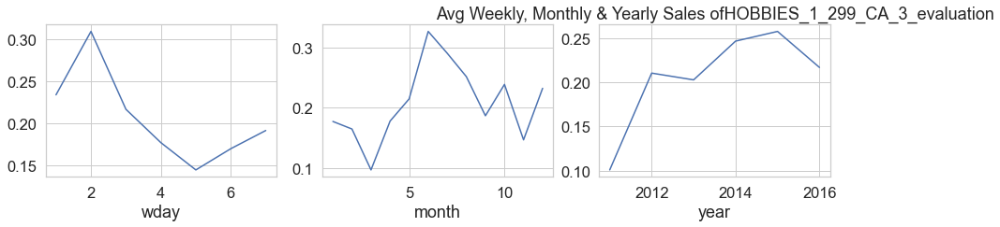

...

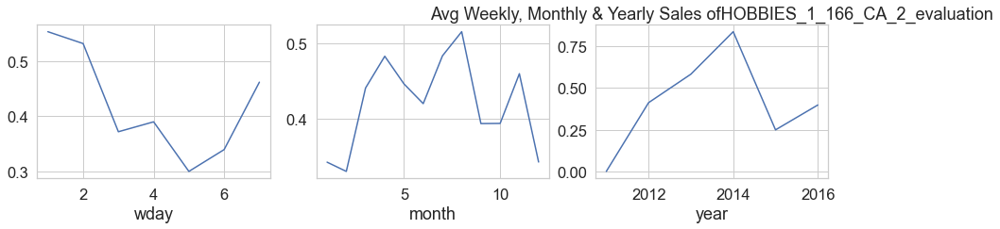

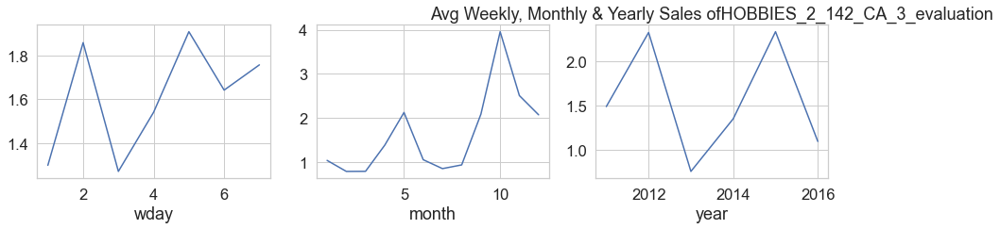

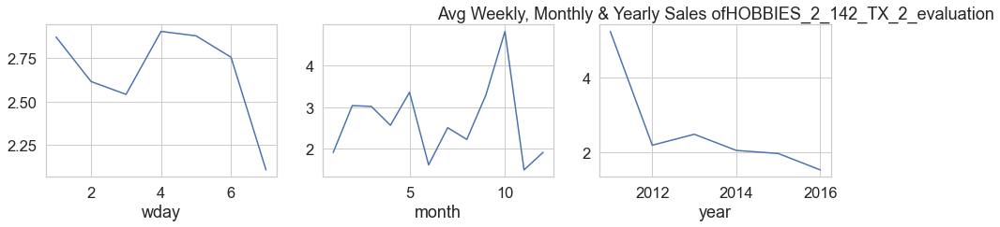

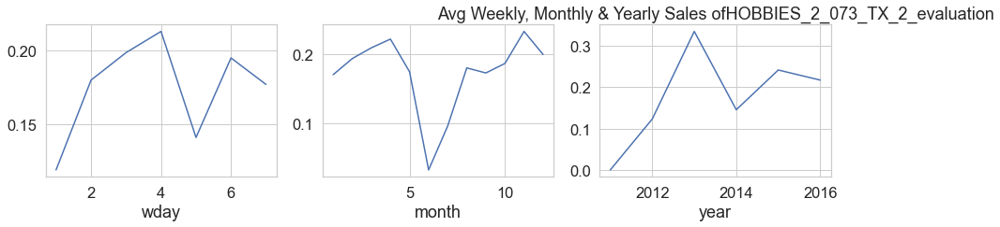

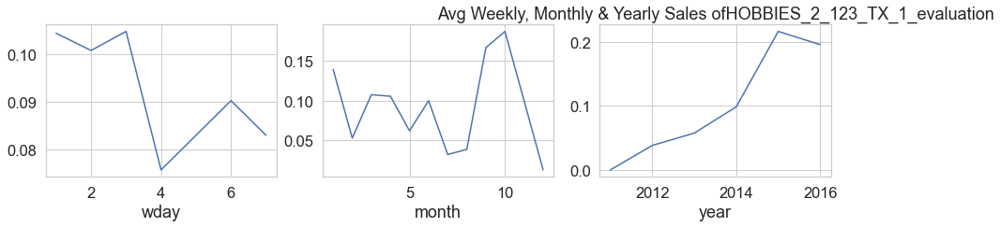

In [84]:
hobbies_pdts=hobbies_df.columns[2:5650]
for i in range(20):
    num=random.choice(list(range(len(hobbies_pdts))))
    fig,axes=plt.subplots(1,3)
    plt.title('Avg Weekly, Monthly & Yearly Sales of'+hobbies_pdts[num])
    hobbies_df.groupby('wday').mean()[hobbies_pdts[num]].plot(ax=axes[0],figsize=(15,3))
    hobbies_df.groupby('month').mean()[hobbies_pdts[num]].plot(ax=axes[1],figsize=(15,3))
    hobbies_df.groupby('year').mean()[hobbies_pdts[num]].plot(ax=axes[2],figsize=(15,3))
    plt.show()

En el caso de los artículos de hobbies los días 1 y 2 de la semana son los más comunes para realizar compras, a su vez el día 7 empieza a subir para el pico generado en el día 1 en la mayoría de los casos.

en cuanto a los meses en la mayoría pareciera tener un comportamiento más errático a comparación de los días, sin embargo, si se mira más detenidamente se puede observar que los meses 1, 2 y 12 tienden a tener un mayor aumento en las ventas a comparación del resto. Posiblemente sea debido a los eventos navideños.

En cuanto a los años algunos artículos han tenido un declive significativo mientras otros empiezan el ascenso. Esto puede deberse a cambios tecnológicos o tendencias, el foco llega a un nuevo producto y otro empieza a bajar a medida que pierde popularidad.


# Selección aleatoria de ventas de producto tipo 'Food' a nivel semanal, mensual y anual

In [85]:
foods_df=historico_ventas_df[historico_ventas_df['cat_id']=='FOODS'][['id']+ d_cols].set_index('id').T
foods_df=foods_df.reset_index().rename(columns={'index':'d'})
foods_df=pd.merge(foods_df,calendar_df,how='left',left_on='d',right_on='d').set_index('date')

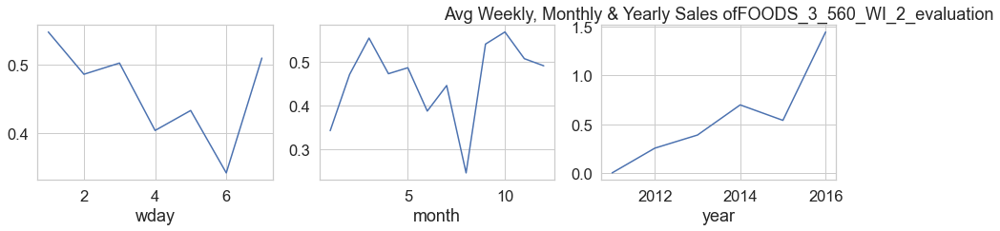

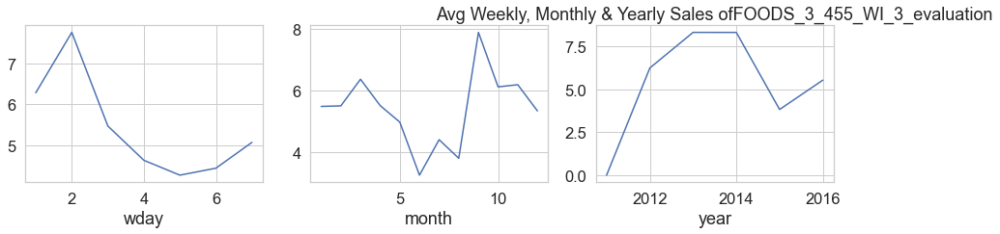

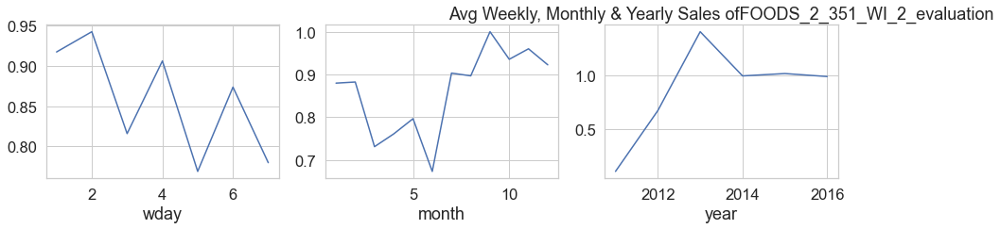

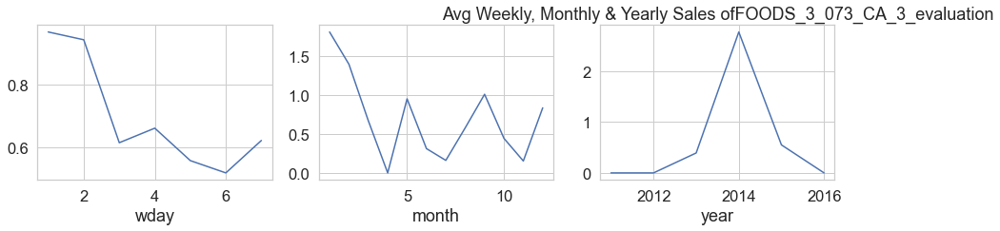

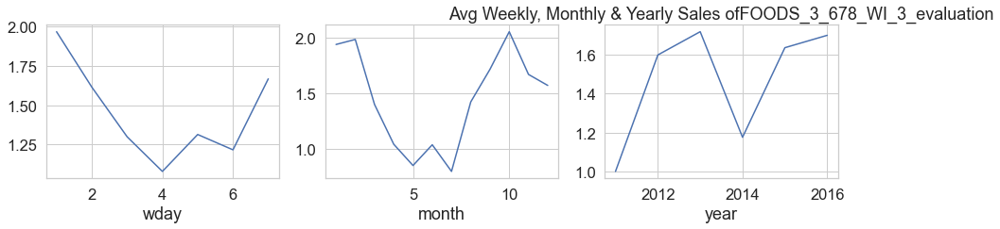

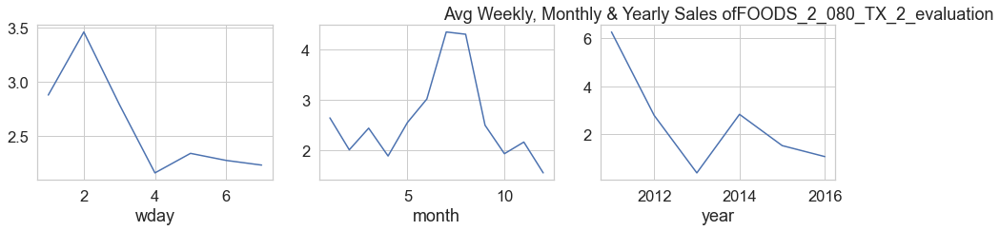

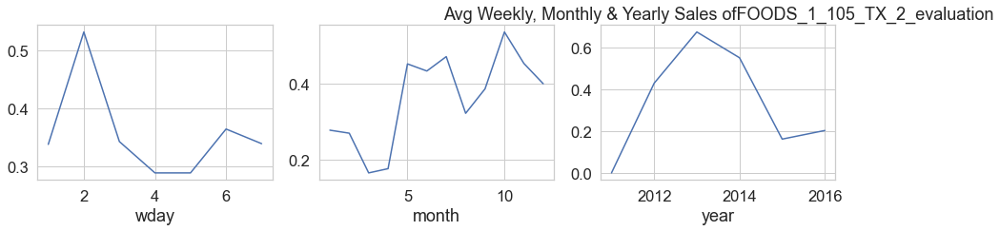

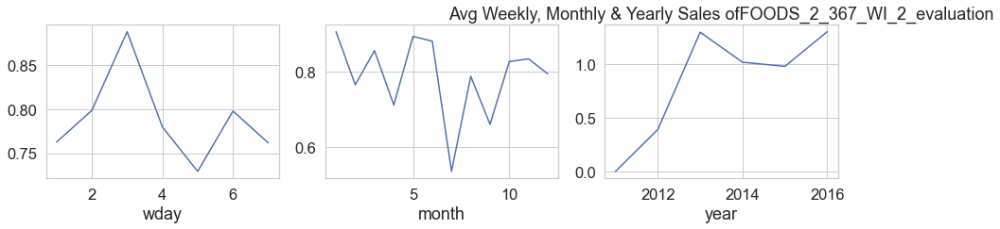

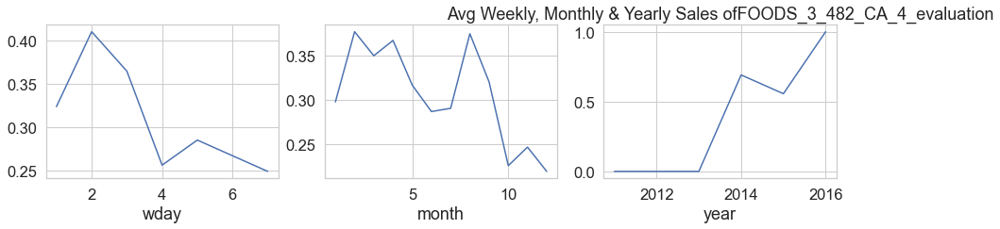

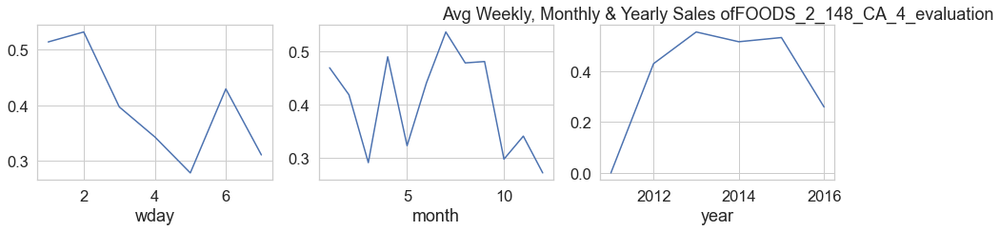

In [86]:
foods_pdts=foods_df.columns[2:14370]
for i in range(10):
    num=random.choice(list(range(len(foods_pdts))))
    fig,axes=plt.subplots(1,3)
    plt.title('Avg Weekly, Monthly & Yearly Sales of'+foods_pdts[num])
    foods_df.groupby('wday').mean()[foods_pdts[num]].plot(ax=axes[0],figsize=(15,3))
    foods_df.groupby('month').mean()[foods_pdts[num]].plot(ax=axes[1],figsize=(15,3))
    foods_df.groupby('year').mean()[foods_pdts[num]].plot(ax=axes[2],figsize=(15,3))
    plt.show()

En la sección de comida se denota una tendencia muy clara en de compra en el primer día de la semana, esto se puede deber a que se genera la compra para todos los días, en el resto de días parece tener más compras esporádicas al final de la semana. En mitad de semana tiende a tener ventas extremadamente bajas.

En el caso de los meses hay un comportamiento un poco más variado, pero parece ser a mitad de año es un tiempo donde se merca en grandes cantidades. Las vacaciones de verano y lo que esto implica puede que genere estos cambios, sea por compra de personas nuevas en la región por tiempo limitado o abastecimiento para salir hacia otros lugares.

En cuanto a los años ha tenido una tendencia a subir las compras exceptuando algunos productos, la perdida de venta de productos puede deberse a que están siendo reemplazados por nuevos o han empezado a salir del mercado.

# Selección aleatoria de ventas de producto tipo 'Household' a nivel semanal, mensual y anual

In [87]:
household_df=historico_ventas_df[historico_ventas_df['cat_id']=='HOUSEHOLD'][['id']+ d_cols].set_index('id').T
household_df=household_df.reset_index().rename(columns={'index':'d'})
household_df=pd.merge(household_df,calendar_df,how='left',left_on='d',right_on='d').set_index('date')

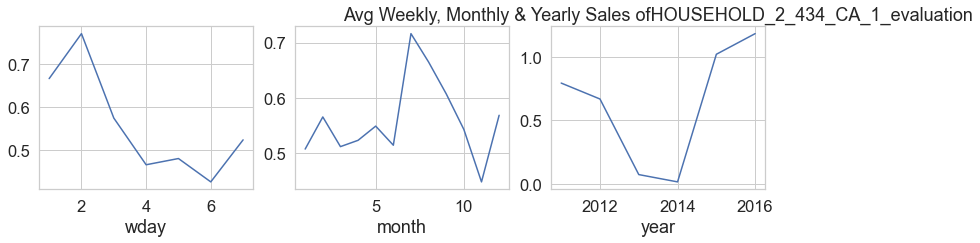

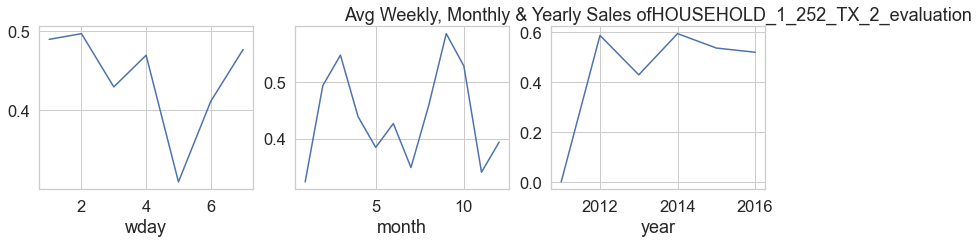

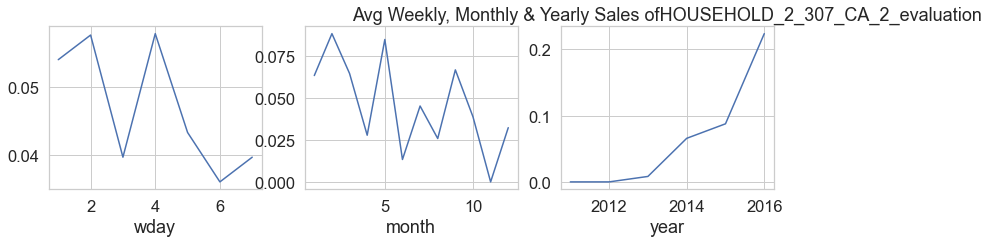

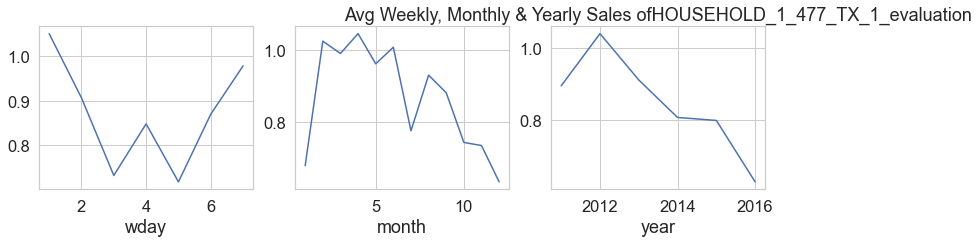

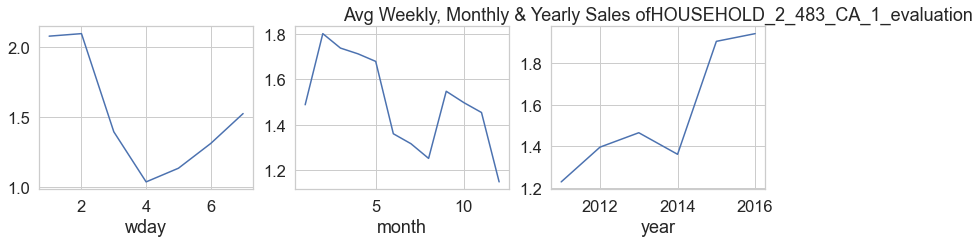

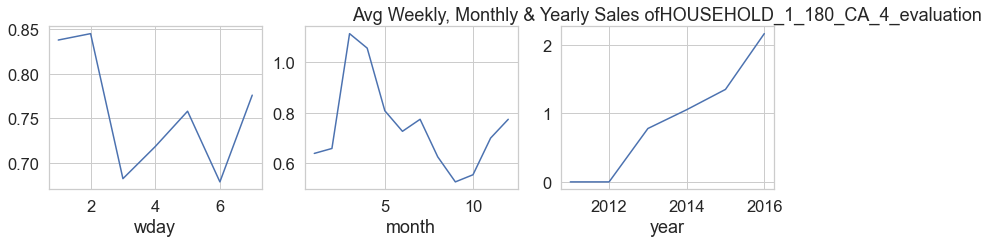

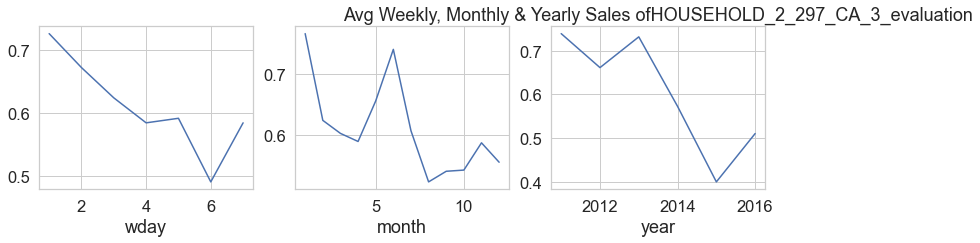

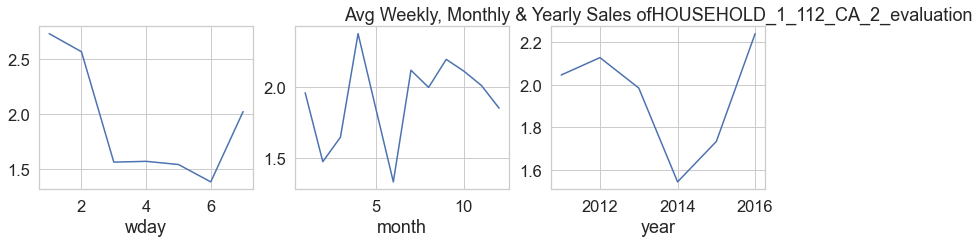

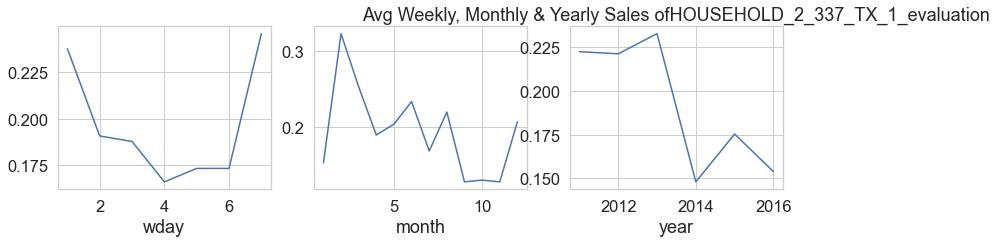

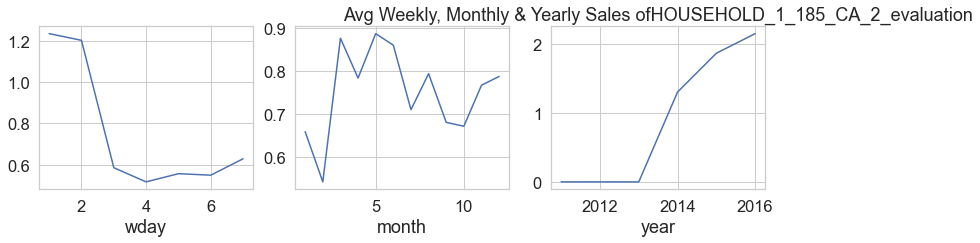

In [88]:
household_pdts=household_df.columns[2:10470]
for i in range(10):
    num=random.choice(list(range(len(hobbies_pdts))))
    fig,axes=plt.subplots(1,3)
    plt.title('Avg Weekly, Monthly & Yearly Sales of'+household_pdts[num])
    household_df.groupby('wday').mean()[household_pdts[num]].plot(ax=axes[0],figsize=(13,3))
    household_df.groupby('month').mean()[household_pdts[num]].plot(ax=axes[1],figsize=(13,3))
    household_df.groupby('year').mean()[household_pdts[num]].plot(ax=axes[2],figsize=(13,3))
    plt.show()

En el caso de los productos del hogar se ve una tendencia en el día 1 y 2 de la semana, esto podría deberse a que son comprados junto a la comida.

En ventas mensuales tiene una venta menos frecuentes y se da por periodos de tiempo, al ser productos no perecederos la mayoría eso podría indicar que compra para varios meses y esto causa las subidas y bajadas en ventas tan abruptas observadas.

En cuanto a la venta en años, muchos tuvieron un auge alrededor de 2013 o 204, pero han ido decreciendo en ventas. Un motivo puede ser que hay tiendas especializadas en estos productos y están robando el mercado de Walmart o la tendencia a consumo más amigables medio ambientalmente los está llevando a compra en otros lados o tiendas especializadas.

### Conclusión segmento

En este apartado se distingue que las ventas a inicio y final de semana son las más importantes para Walmart, una posible explicación es debido a los ciclos laborares de las personas.

Se nota un mejor posicionamiento en la categoría de comida y se espera que este sea el que siga demostrando mayor crecimiento según lo observado.